<a href="https://colab.research.google.com/github/HilkarSoberanes/MachineLearning/blob/main/Pytorch_CVAE_MNIST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [93]:

import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd 
import random 
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

data_dir = 'dataset'

train_dataset = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

train_transform = transforms.Compose([
transforms.ToTensor(),
])

test_transform = transforms.Compose([
transforms.ToTensor(),
])

train_dataset.transform = train_transform
test_dataset.transform = test_transform

m=len(train_dataset)

train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])
batch_size=256

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

In [94]:

class VariationalEncoder(nn.Module):
    def __init__(self, latent_dims):  
        super(VariationalEncoder, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(8, 16, 3, stride=2, padding=1)
        self.batch2 = nn.BatchNorm2d(16)
        self.conv3 = nn.Conv2d(16, 32, 3, stride=2, padding=0)  
        self.linear1 = nn.Linear(3*3*32, 128)
        self.linear2 = nn.Linear(128, latent_dims)
        self.linear3 = nn.Linear(128, latent_dims)

        self.N = torch.distributions.Normal(0, 1)
        self.N.loc = self.N.loc.cuda() # hack to get sampling on the GPU
        self.N.scale = self.N.scale.cuda()
        self.kl = 0

    def forward(self, x):
        x = x.to(device)
        x = F.relu(self.conv1(x))
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.relu(self.conv3(x))
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))
        mu =  self.linear2(x)
        sigma = torch.exp(self.linear3(x))
        z = mu + sigma*self.N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z      

In [95]:
class Decoder(nn.Module):
    
    def __init__(self, latent_dims):
        super().__init__()

        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dims, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [96]:

class VariationalAutoencoder(nn.Module):
    def __init__(self, latent_dims):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        x = x.to(device)
        z = self.encoder(x)
        return self.decoder(z)

In [97]:

### Set the random seed for reproducible results
torch.manual_seed(0)

d = 4

vae = VariationalAutoencoder(latent_dims=d)

lr = 1e-3 

optim = torch.optim.Adam(vae.parameters(), lr=lr, weight_decay=1e-5)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

vae.to(device)

Selected device: cuda


VariationalAutoencoder(
  (encoder): VariationalEncoder(
    (conv1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (batch2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (linear1): Linear(in_features=288, out_features=128, bias=True)
    (linear2): Linear(in_features=128, out_features=4, bias=True)
    (linear3): Linear(in_features=128, out_features=4, bias=True)
  )
  (decoder): Decoder(
    (decoder_lin): Sequential(
      (0): Linear(in_features=4, out_features=128, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=128, out_features=288, bias=True)
      (3): ReLU(inplace=True)
    )
    (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
    (decoder_conv): Sequential(
      (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
      (1): BatchN

In [98]:

### Training function
def train_epoch(vae, device, dataloader, optimizer):
    # Set train mode for both the encoder and the decoder
    vae.train()
    train_loss = 0.0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for x, _ in dataloader: 
        # Move tensor to the proper device
        x = x.to(device)
        x_hat = vae(x)
        # Evaluate loss
        loss = ((x - x_hat)**2).sum() + vae.encoder.kl

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.item()))
        train_loss+=loss.item()

    return train_loss / len(dataloader.dataset)

In [99]:

### Testing function
def test_epoch(vae, device, dataloader):
    # Set evaluation mode for encoder and decoder
    vae.eval()
    val_loss = 0.0
    with torch.no_grad(): # No need to track the gradients
        for x, _ in dataloader:
            # Move tensor to the proper device
            x = x.to(device)
            # Encode data
            encoded_data = vae.encoder(x)
            # Decode data
            x_hat = vae(x)
            loss = ((x - x_hat)**2).sum() + vae.encoder.kl
            val_loss += loss.item()

    return val_loss / len(dataloader.dataset)

In [100]:

def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      #img = test_dataset[t_idx[i]][0].unsqueeze(0)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()  

	 partial train loss (single batch): 69296.070312
	 partial train loss (single batch): 67533.789062
	 partial train loss (single batch): 66133.453125
	 partial train loss (single batch): 64625.222656
	 partial train loss (single batch): 63039.566406
	 partial train loss (single batch): 61851.617188
	 partial train loss (single batch): 61580.671875
	 partial train loss (single batch): 60901.226562
	 partial train loss (single batch): 59970.210938
	 partial train loss (single batch): 59368.906250
	 partial train loss (single batch): 58557.894531
	 partial train loss (single batch): 58167.578125
	 partial train loss (single batch): 58042.757812
	 partial train loss (single batch): 56918.558594
	 partial train loss (single batch): 56562.316406
	 partial train loss (single batch): 56367.136719
	 partial train loss (single batch): 56251.816406
	 partial train loss (single batch): 55604.128906
	 partial train loss (single batch): 54979.968750
	 partial train loss (single batch): 54885.457031


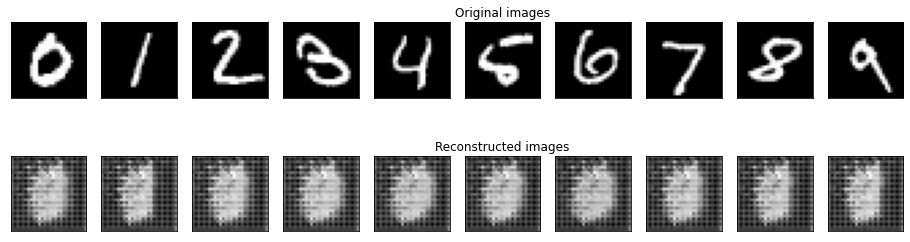

	 partial train loss (single batch): 19881.009766
	 partial train loss (single batch): 19862.130859
	 partial train loss (single batch): 19782.072266
	 partial train loss (single batch): 19827.269531
	 partial train loss (single batch): 19785.763672
	 partial train loss (single batch): 20079.650391
	 partial train loss (single batch): 19470.640625
	 partial train loss (single batch): 19196.361328
	 partial train loss (single batch): 19260.423828
	 partial train loss (single batch): 19130.548828
	 partial train loss (single batch): 19218.087891
	 partial train loss (single batch): 19292.390625
	 partial train loss (single batch): 18877.197266
	 partial train loss (single batch): 19184.664062
	 partial train loss (single batch): 19003.509766
	 partial train loss (single batch): 18858.734375
	 partial train loss (single batch): 18612.271484
	 partial train loss (single batch): 18746.804688
	 partial train loss (single batch): 18749.277344
	 partial train loss (single batch): 18473.554688


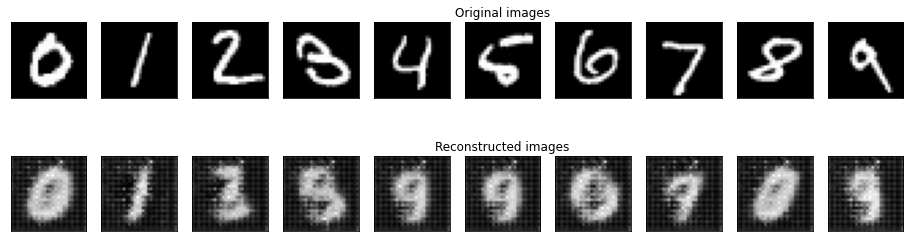

	 partial train loss (single batch): 13455.351562
	 partial train loss (single batch): 13472.400391
	 partial train loss (single batch): 13367.775391
	 partial train loss (single batch): 13481.288086
	 partial train loss (single batch): 13434.812500
	 partial train loss (single batch): 13819.781250
	 partial train loss (single batch): 13252.619141
	 partial train loss (single batch): 12894.326172
	 partial train loss (single batch): 13037.959961
	 partial train loss (single batch): 13013.864258
	 partial train loss (single batch): 13308.821289
	 partial train loss (single batch): 13316.442383
	 partial train loss (single batch): 12893.038086
	 partial train loss (single batch): 13413.001953
	 partial train loss (single batch): 13297.882812
	 partial train loss (single batch): 13020.615234
	 partial train loss (single batch): 12603.481445
	 partial train loss (single batch): 12919.208008
	 partial train loss (single batch): 13054.678711
	 partial train loss (single batch): 12654.136719


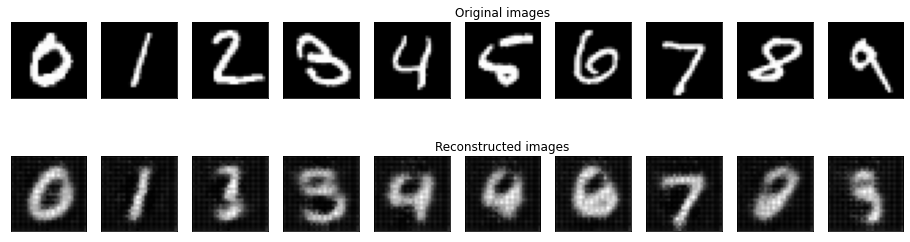

	 partial train loss (single batch): 10930.470703
	 partial train loss (single batch): 10857.374023
	 partial train loss (single batch): 10852.577148
	 partial train loss (single batch): 10932.486328
	 partial train loss (single batch): 10726.641602
	 partial train loss (single batch): 11171.923828
	 partial train loss (single batch): 10771.910156
	 partial train loss (single batch): 10499.812500
	 partial train loss (single batch): 10624.492188
	 partial train loss (single batch): 10579.992188
	 partial train loss (single batch): 10846.174805
	 partial train loss (single batch): 10768.488281
	 partial train loss (single batch): 10449.771484
	 partial train loss (single batch): 10984.332031
	 partial train loss (single batch): 10874.340820
	 partial train loss (single batch): 10535.194336
	 partial train loss (single batch): 10274.031250
	 partial train loss (single batch): 10593.000977
	 partial train loss (single batch): 10603.782227
	 partial train loss (single batch): 10358.752930


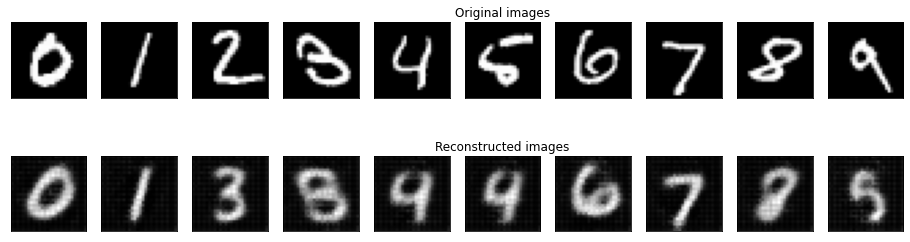

	 partial train loss (single batch): 9973.739258
	 partial train loss (single batch): 9912.425781
	 partial train loss (single batch): 9919.976562
	 partial train loss (single batch): 10103.125000
	 partial train loss (single batch): 9791.385742
	 partial train loss (single batch): 10191.699219
	 partial train loss (single batch): 9802.441406
	 partial train loss (single batch): 9486.223633
	 partial train loss (single batch): 9724.996094
	 partial train loss (single batch): 9714.021484
	 partial train loss (single batch): 10001.690430
	 partial train loss (single batch): 9925.156250
	 partial train loss (single batch): 9600.210938
	 partial train loss (single batch): 10071.228516
	 partial train loss (single batch): 9985.904297
	 partial train loss (single batch): 9719.745117
	 partial train loss (single batch): 9192.021484
	 partial train loss (single batch): 9670.748047
	 partial train loss (single batch): 9791.831055
	 partial train loss (single batch): 9497.173828
	 partial train 

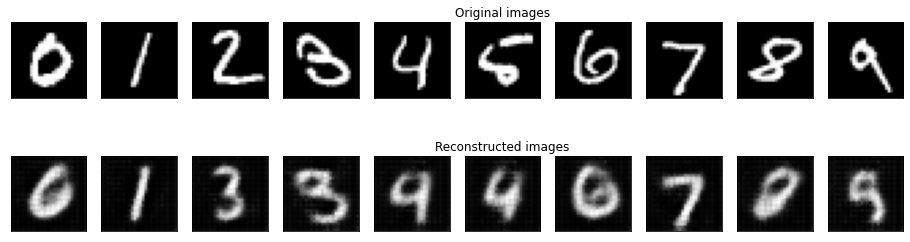

	 partial train loss (single batch): 9540.164062
	 partial train loss (single batch): 9593.040039
	 partial train loss (single batch): 9601.885742
	 partial train loss (single batch): 9564.896484
	 partial train loss (single batch): 9427.638672
	 partial train loss (single batch): 9671.663086
	 partial train loss (single batch): 9462.617188
	 partial train loss (single batch): 9128.361328
	 partial train loss (single batch): 9369.065430
	 partial train loss (single batch): 9293.565430
	 partial train loss (single batch): 9665.534180
	 partial train loss (single batch): 9620.865234
	 partial train loss (single batch): 9280.761719
	 partial train loss (single batch): 9687.931641
	 partial train loss (single batch): 9670.984375
	 partial train loss (single batch): 9406.731445
	 partial train loss (single batch): 8918.568359
	 partial train loss (single batch): 9351.385742
	 partial train loss (single batch): 9447.973633
	 partial train loss (single batch): 9089.761719
	 partial train loss

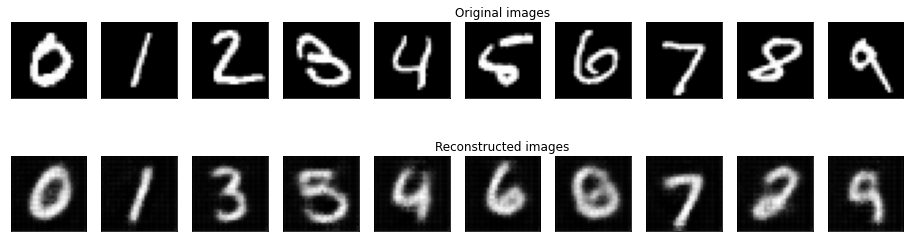

	 partial train loss (single batch): 9218.598633
	 partial train loss (single batch): 9353.329102
	 partial train loss (single batch): 9363.714844
	 partial train loss (single batch): 9281.935547
	 partial train loss (single batch): 9297.657227
	 partial train loss (single batch): 9545.128906
	 partial train loss (single batch): 9106.282227
	 partial train loss (single batch): 8895.071289
	 partial train loss (single batch): 9110.241211
	 partial train loss (single batch): 9033.853516
	 partial train loss (single batch): 9423.792969
	 partial train loss (single batch): 9359.726562
	 partial train loss (single batch): 8955.078125
	 partial train loss (single batch): 9470.587891
	 partial train loss (single batch): 9373.657227
	 partial train loss (single batch): 9195.883789
	 partial train loss (single batch): 8623.761719
	 partial train loss (single batch): 9045.701172
	 partial train loss (single batch): 9124.112305
	 partial train loss (single batch): 8803.206055
	 partial train loss

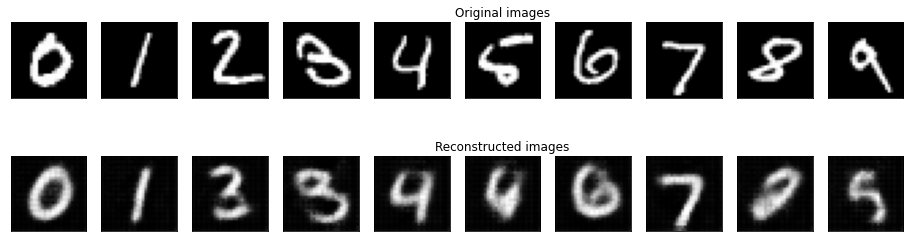

	 partial train loss (single batch): 9037.542969
	 partial train loss (single batch): 9177.253906
	 partial train loss (single batch): 9118.818359
	 partial train loss (single batch): 9093.480469
	 partial train loss (single batch): 9016.298828
	 partial train loss (single batch): 9337.302734
	 partial train loss (single batch): 9015.647461
	 partial train loss (single batch): 8773.204102
	 partial train loss (single batch): 8952.559570
	 partial train loss (single batch): 8951.134766
	 partial train loss (single batch): 9342.138672
	 partial train loss (single batch): 9244.835938
	 partial train loss (single batch): 8926.993164
	 partial train loss (single batch): 9367.993164
	 partial train loss (single batch): 9229.064453
	 partial train loss (single batch): 8946.877930
	 partial train loss (single batch): 8564.737305
	 partial train loss (single batch): 8916.465820
	 partial train loss (single batch): 9027.162109
	 partial train loss (single batch): 8691.313477
	 partial train loss

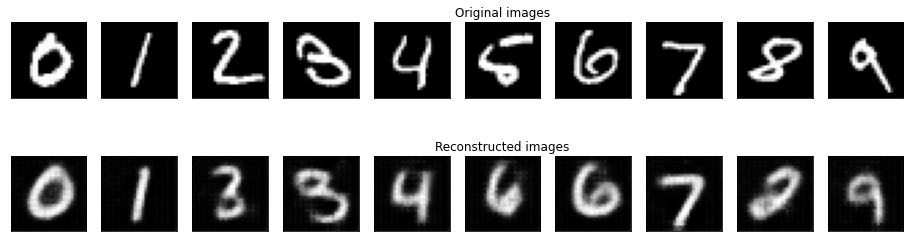

	 partial train loss (single batch): 9014.541016
	 partial train loss (single batch): 9049.638672
	 partial train loss (single batch): 9034.699219
	 partial train loss (single batch): 9099.683594
	 partial train loss (single batch): 9011.964844
	 partial train loss (single batch): 9176.185547
	 partial train loss (single batch): 8877.509766
	 partial train loss (single batch): 8645.490234
	 partial train loss (single batch): 8814.820312
	 partial train loss (single batch): 8790.898438
	 partial train loss (single batch): 9221.954102
	 partial train loss (single batch): 9054.005859
	 partial train loss (single batch): 8721.102539
	 partial train loss (single batch): 9152.466797
	 partial train loss (single batch): 9042.375000
	 partial train loss (single batch): 8825.475586
	 partial train loss (single batch): 8357.994141
	 partial train loss (single batch): 8883.035156
	 partial train loss (single batch): 8886.469727
	 partial train loss (single batch): 8601.310547
	 partial train loss

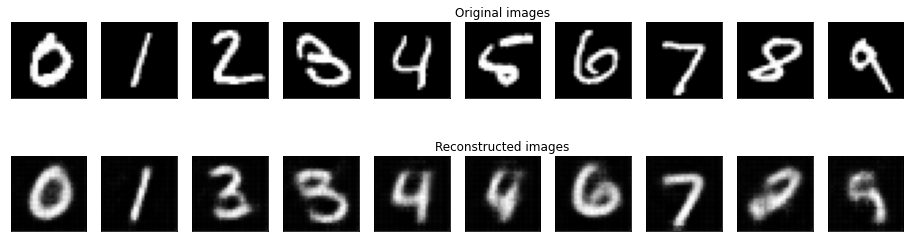

	 partial train loss (single batch): 8889.947266
	 partial train loss (single batch): 8929.386719
	 partial train loss (single batch): 8952.142578
	 partial train loss (single batch): 8915.369141
	 partial train loss (single batch): 8839.328125
	 partial train loss (single batch): 9131.332031
	 partial train loss (single batch): 8859.660156
	 partial train loss (single batch): 8523.158203
	 partial train loss (single batch): 8761.486328
	 partial train loss (single batch): 8650.154297
	 partial train loss (single batch): 9154.875000
	 partial train loss (single batch): 8941.361328
	 partial train loss (single batch): 8596.695312
	 partial train loss (single batch): 9084.486328
	 partial train loss (single batch): 9109.528320
	 partial train loss (single batch): 8749.535156
	 partial train loss (single batch): 8264.414062
	 partial train loss (single batch): 8806.433594
	 partial train loss (single batch): 8819.982422
	 partial train loss (single batch): 8554.921875
	 partial train loss

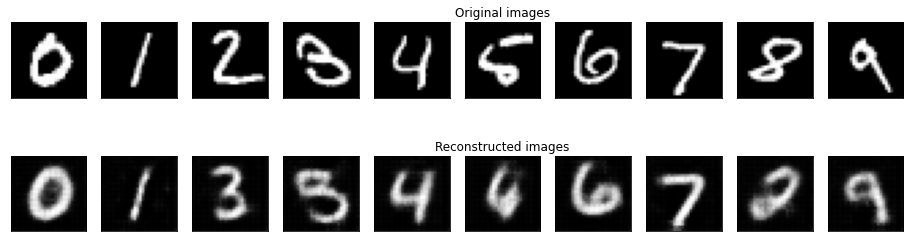

	 partial train loss (single batch): 8848.684570
	 partial train loss (single batch): 8821.549805
	 partial train loss (single batch): 8894.987305
	 partial train loss (single batch): 8892.695312
	 partial train loss (single batch): 8844.449219
	 partial train loss (single batch): 9114.720703
	 partial train loss (single batch): 8772.028320
	 partial train loss (single batch): 8526.974609
	 partial train loss (single batch): 8680.714844
	 partial train loss (single batch): 8581.950195
	 partial train loss (single batch): 9125.101562
	 partial train loss (single batch): 8958.386719
	 partial train loss (single batch): 8505.664062
	 partial train loss (single batch): 9080.255859
	 partial train loss (single batch): 9045.425781
	 partial train loss (single batch): 8732.024414
	 partial train loss (single batch): 8155.722656
	 partial train loss (single batch): 8755.853516
	 partial train loss (single batch): 8728.603516
	 partial train loss (single batch): 8467.244141
	 partial train loss

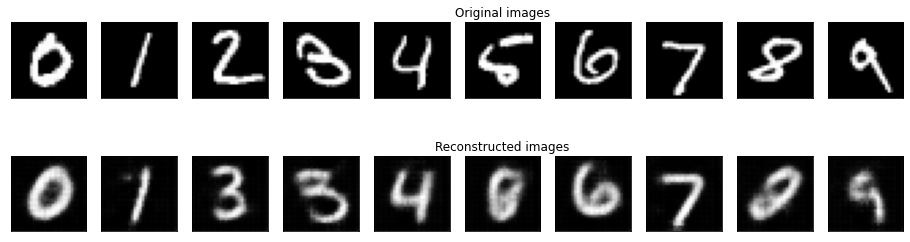

	 partial train loss (single batch): 8812.535156
	 partial train loss (single batch): 8784.055664
	 partial train loss (single batch): 8852.575195
	 partial train loss (single batch): 8850.725586
	 partial train loss (single batch): 8749.388672
	 partial train loss (single batch): 8984.974609
	 partial train loss (single batch): 8763.169922
	 partial train loss (single batch): 8342.381836
	 partial train loss (single batch): 8649.425781
	 partial train loss (single batch): 8534.152344
	 partial train loss (single batch): 9059.085938
	 partial train loss (single batch): 8824.519531
	 partial train loss (single batch): 8523.563477
	 partial train loss (single batch): 9011.346680
	 partial train loss (single batch): 8964.932617
	 partial train loss (single batch): 8732.236328
	 partial train loss (single batch): 8165.458984
	 partial train loss (single batch): 8768.202148
	 partial train loss (single batch): 8662.178711
	 partial train loss (single batch): 8508.677734
	 partial train loss

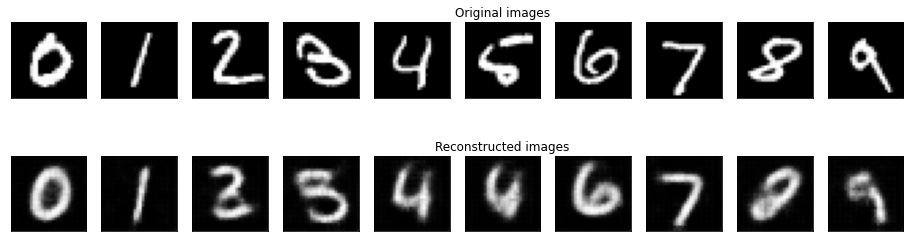

	 partial train loss (single batch): 8779.930664
	 partial train loss (single batch): 8743.641602
	 partial train loss (single batch): 8759.214844
	 partial train loss (single batch): 8785.291016
	 partial train loss (single batch): 8728.974609
	 partial train loss (single batch): 8989.951172
	 partial train loss (single batch): 8667.153320
	 partial train loss (single batch): 8428.980469
	 partial train loss (single batch): 8642.518555
	 partial train loss (single batch): 8526.028320
	 partial train loss (single batch): 9021.301758
	 partial train loss (single batch): 8780.986328
	 partial train loss (single batch): 8459.236328
	 partial train loss (single batch): 8949.376953
	 partial train loss (single batch): 8892.851562
	 partial train loss (single batch): 8626.822266
	 partial train loss (single batch): 8080.618164
	 partial train loss (single batch): 8604.335938
	 partial train loss (single batch): 8725.193359
	 partial train loss (single batch): 8391.242188
	 partial train loss

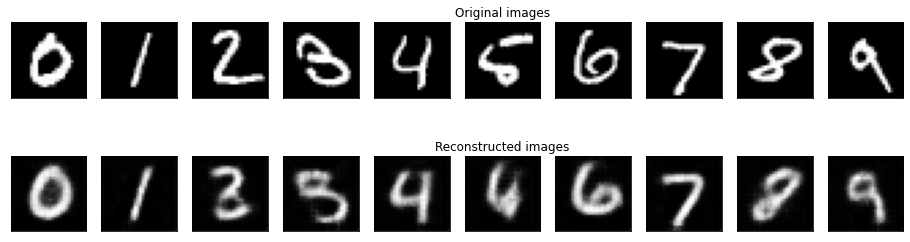

	 partial train loss (single batch): 8689.917969
	 partial train loss (single batch): 8728.876953
	 partial train loss (single batch): 8670.739258
	 partial train loss (single batch): 8666.678711
	 partial train loss (single batch): 8728.552734
	 partial train loss (single batch): 8909.221680
	 partial train loss (single batch): 8588.609375
	 partial train loss (single batch): 8377.741211
	 partial train loss (single batch): 8543.031250
	 partial train loss (single batch): 8558.175781
	 partial train loss (single batch): 9021.251953
	 partial train loss (single batch): 8726.615234
	 partial train loss (single batch): 8474.058594
	 partial train loss (single batch): 8920.562500
	 partial train loss (single batch): 8874.778320
	 partial train loss (single batch): 8592.394531
	 partial train loss (single batch): 8129.771484
	 partial train loss (single batch): 8540.931641
	 partial train loss (single batch): 8579.085938
	 partial train loss (single batch): 8344.900391
	 partial train loss

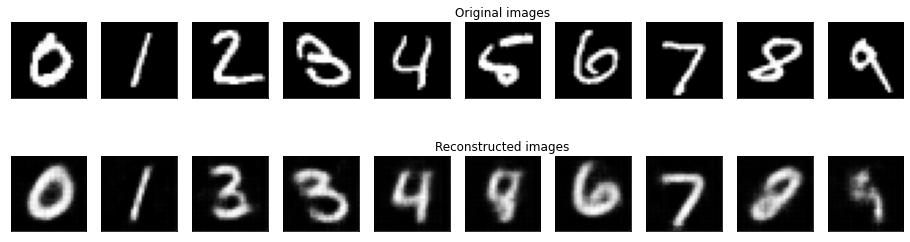

	 partial train loss (single batch): 8695.982422
	 partial train loss (single batch): 8659.292969
	 partial train loss (single batch): 8679.011719
	 partial train loss (single batch): 8669.876953
	 partial train loss (single batch): 8596.047852
	 partial train loss (single batch): 8941.496094
	 partial train loss (single batch): 8597.263672
	 partial train loss (single batch): 8286.086914
	 partial train loss (single batch): 8497.845703
	 partial train loss (single batch): 8454.397461
	 partial train loss (single batch): 8879.122070
	 partial train loss (single batch): 8707.408203
	 partial train loss (single batch): 8437.737305
	 partial train loss (single batch): 8849.324219
	 partial train loss (single batch): 8959.247070
	 partial train loss (single batch): 8530.119141
	 partial train loss (single batch): 8015.014160
	 partial train loss (single batch): 8515.814453
	 partial train loss (single batch): 8541.346680
	 partial train loss (single batch): 8337.926758
	 partial train loss

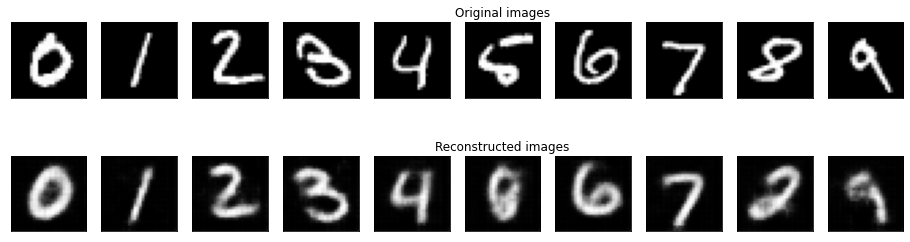

	 partial train loss (single batch): 8627.589844
	 partial train loss (single batch): 8586.628906
	 partial train loss (single batch): 8746.675781
	 partial train loss (single batch): 8663.157227
	 partial train loss (single batch): 8590.103516
	 partial train loss (single batch): 8936.689453
	 partial train loss (single batch): 8586.699219
	 partial train loss (single batch): 8263.712891
	 partial train loss (single batch): 8513.072266
	 partial train loss (single batch): 8409.118164
	 partial train loss (single batch): 8975.789062
	 partial train loss (single batch): 8696.386719
	 partial train loss (single batch): 8392.634766
	 partial train loss (single batch): 8946.726562
	 partial train loss (single batch): 8857.581055
	 partial train loss (single batch): 8547.564453
	 partial train loss (single batch): 7996.980469
	 partial train loss (single batch): 8548.481445
	 partial train loss (single batch): 8526.535156
	 partial train loss (single batch): 8262.909180
	 partial train loss

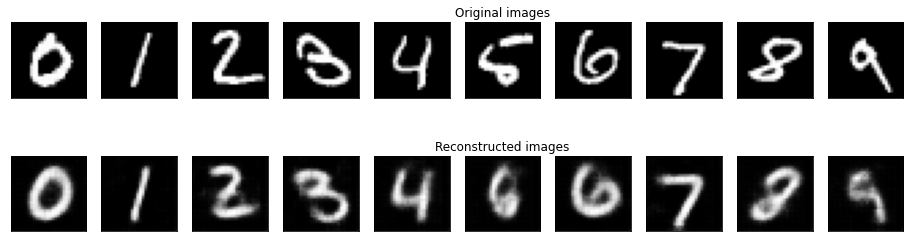

	 partial train loss (single batch): 8650.340820
	 partial train loss (single batch): 8568.111328
	 partial train loss (single batch): 8593.458984
	 partial train loss (single batch): 8631.267578
	 partial train loss (single batch): 8533.408203
	 partial train loss (single batch): 8863.059570
	 partial train loss (single batch): 8561.064453
	 partial train loss (single batch): 8310.994141
	 partial train loss (single batch): 8543.021484
	 partial train loss (single batch): 8462.406250
	 partial train loss (single batch): 8890.755859
	 partial train loss (single batch): 8747.015625
	 partial train loss (single batch): 8264.269531
	 partial train loss (single batch): 8901.782227
	 partial train loss (single batch): 8938.827148
	 partial train loss (single batch): 8547.614258
	 partial train loss (single batch): 7975.711426
	 partial train loss (single batch): 8499.900391
	 partial train loss (single batch): 8493.625977
	 partial train loss (single batch): 8281.662109
	 partial train loss

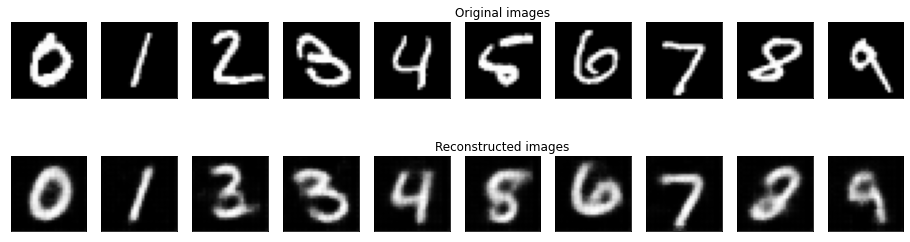

	 partial train loss (single batch): 8588.662109
	 partial train loss (single batch): 8601.694336
	 partial train loss (single batch): 8645.341797
	 partial train loss (single batch): 8654.510742
	 partial train loss (single batch): 8608.343750
	 partial train loss (single batch): 8889.689453
	 partial train loss (single batch): 8525.885742
	 partial train loss (single batch): 8200.575195
	 partial train loss (single batch): 8424.733398
	 partial train loss (single batch): 8376.902344
	 partial train loss (single batch): 8864.719727
	 partial train loss (single batch): 8642.860352
	 partial train loss (single batch): 8232.927734
	 partial train loss (single batch): 8880.492188
	 partial train loss (single batch): 8810.450195
	 partial train loss (single batch): 8503.527344
	 partial train loss (single batch): 8000.096680
	 partial train loss (single batch): 8449.119141
	 partial train loss (single batch): 8430.301758
	 partial train loss (single batch): 8293.305664
	 partial train loss

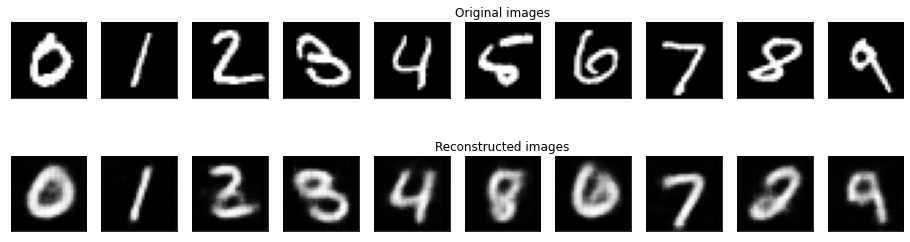

	 partial train loss (single batch): 8557.423828
	 partial train loss (single batch): 8581.175781
	 partial train loss (single batch): 8586.948242
	 partial train loss (single batch): 8598.316406
	 partial train loss (single batch): 8499.191406
	 partial train loss (single batch): 8773.525391
	 partial train loss (single batch): 8628.434570
	 partial train loss (single batch): 8271.451172
	 partial train loss (single batch): 8437.542969
	 partial train loss (single batch): 8395.597656
	 partial train loss (single batch): 8780.912109
	 partial train loss (single batch): 8633.168945
	 partial train loss (single batch): 8210.418945
	 partial train loss (single batch): 8859.353516
	 partial train loss (single batch): 8787.941406
	 partial train loss (single batch): 8524.738281
	 partial train loss (single batch): 7958.937500
	 partial train loss (single batch): 8539.865234
	 partial train loss (single batch): 8454.617188
	 partial train loss (single batch): 8302.660156
	 partial train loss

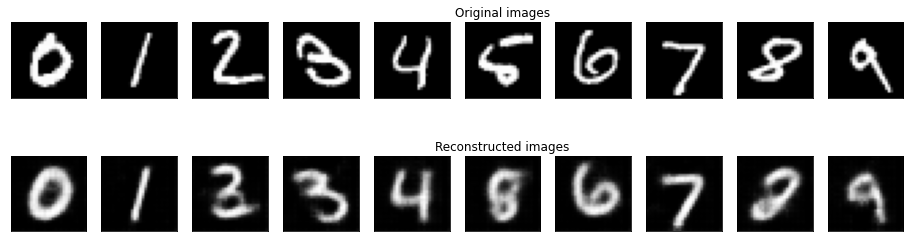

	 partial train loss (single batch): 8445.835938
	 partial train loss (single batch): 8494.105469
	 partial train loss (single batch): 8538.597656
	 partial train loss (single batch): 8531.091797
	 partial train loss (single batch): 8572.931641
	 partial train loss (single batch): 8741.386719
	 partial train loss (single batch): 8451.490234
	 partial train loss (single batch): 8168.566406
	 partial train loss (single batch): 8335.424805
	 partial train loss (single batch): 8273.559570
	 partial train loss (single batch): 8821.982422
	 partial train loss (single batch): 8576.056641
	 partial train loss (single batch): 8280.936523
	 partial train loss (single batch): 8818.298828
	 partial train loss (single batch): 8722.853516
	 partial train loss (single batch): 8439.519531
	 partial train loss (single batch): 7974.000000
	 partial train loss (single batch): 8455.435547
	 partial train loss (single batch): 8470.129883
	 partial train loss (single batch): 8267.367188
	 partial train loss

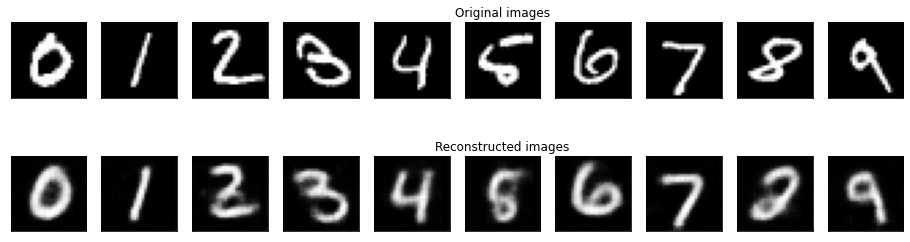

	 partial train loss (single batch): 8508.138672
	 partial train loss (single batch): 8534.755859
	 partial train loss (single batch): 8533.234375
	 partial train loss (single batch): 8547.193359
	 partial train loss (single batch): 8553.672852
	 partial train loss (single batch): 8801.306641
	 partial train loss (single batch): 8554.291016
	 partial train loss (single batch): 8249.610352
	 partial train loss (single batch): 8341.714844
	 partial train loss (single batch): 8458.203125
	 partial train loss (single batch): 8628.660156
	 partial train loss (single batch): 8513.014648
	 partial train loss (single batch): 8261.604492
	 partial train loss (single batch): 8788.099609
	 partial train loss (single batch): 8809.006836
	 partial train loss (single batch): 8511.334961
	 partial train loss (single batch): 7952.917969
	 partial train loss (single batch): 8429.092773
	 partial train loss (single batch): 8399.310547
	 partial train loss (single batch): 8222.677734
	 partial train loss

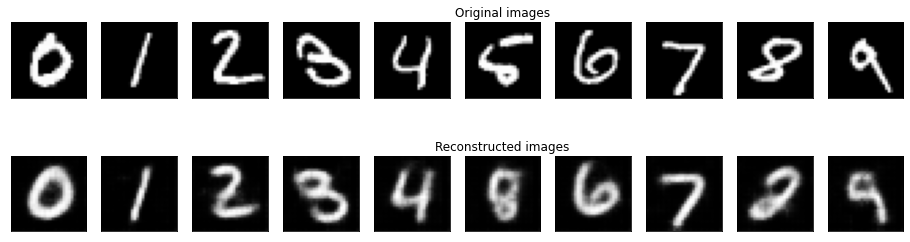

	 partial train loss (single batch): 8533.275391
	 partial train loss (single batch): 8507.724609
	 partial train loss (single batch): 8546.103516
	 partial train loss (single batch): 8550.188477
	 partial train loss (single batch): 8458.539062
	 partial train loss (single batch): 8739.238281
	 partial train loss (single batch): 8530.802734
	 partial train loss (single batch): 8218.646484
	 partial train loss (single batch): 8370.250000
	 partial train loss (single batch): 8377.750000
	 partial train loss (single batch): 8728.066406
	 partial train loss (single batch): 8627.647461
	 partial train loss (single batch): 8208.755859
	 partial train loss (single batch): 8821.428711
	 partial train loss (single batch): 8808.625000
	 partial train loss (single batch): 8454.333984
	 partial train loss (single batch): 7970.875000
	 partial train loss (single batch): 8371.332031
	 partial train loss (single batch): 8380.055664
	 partial train loss (single batch): 8215.726562
	 partial train loss

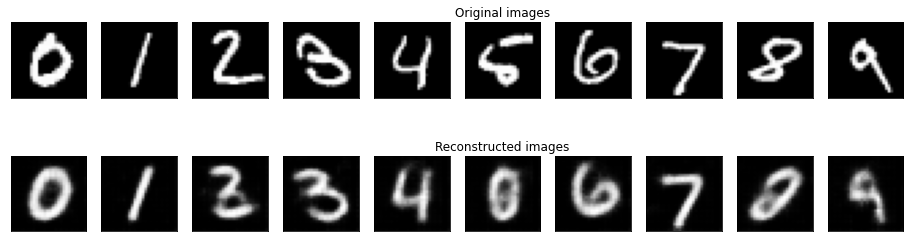

	 partial train loss (single batch): 8473.041992
	 partial train loss (single batch): 8385.269531
	 partial train loss (single batch): 8435.778320
	 partial train loss (single batch): 8525.783203
	 partial train loss (single batch): 8479.449219
	 partial train loss (single batch): 8764.306641
	 partial train loss (single batch): 8450.746094
	 partial train loss (single batch): 8114.731934
	 partial train loss (single batch): 8286.792969
	 partial train loss (single batch): 8320.375000
	 partial train loss (single batch): 8722.501953
	 partial train loss (single batch): 8491.912109
	 partial train loss (single batch): 8155.619629
	 partial train loss (single batch): 8742.652344
	 partial train loss (single batch): 8750.181641
	 partial train loss (single batch): 8451.648438
	 partial train loss (single batch): 7906.490723
	 partial train loss (single batch): 8397.693359
	 partial train loss (single batch): 8310.570312
	 partial train loss (single batch): 8220.767578
	 partial train loss

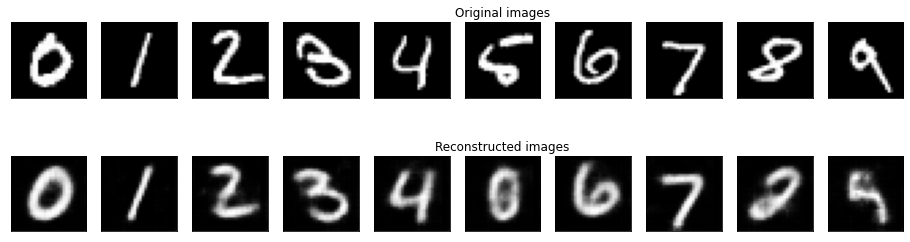

	 partial train loss (single batch): 8500.111328
	 partial train loss (single batch): 8435.789062
	 partial train loss (single batch): 8519.765625
	 partial train loss (single batch): 8518.510742
	 partial train loss (single batch): 8407.236328
	 partial train loss (single batch): 8729.593750
	 partial train loss (single batch): 8443.064453
	 partial train loss (single batch): 8115.317383
	 partial train loss (single batch): 8362.544922
	 partial train loss (single batch): 8339.088867
	 partial train loss (single batch): 8596.820312
	 partial train loss (single batch): 8435.822266
	 partial train loss (single batch): 8142.149414
	 partial train loss (single batch): 8763.639648
	 partial train loss (single batch): 8709.294922
	 partial train loss (single batch): 8377.955078
	 partial train loss (single batch): 7886.593262
	 partial train loss (single batch): 8334.816406
	 partial train loss (single batch): 8314.583984
	 partial train loss (single batch): 8202.655273
	 partial train loss

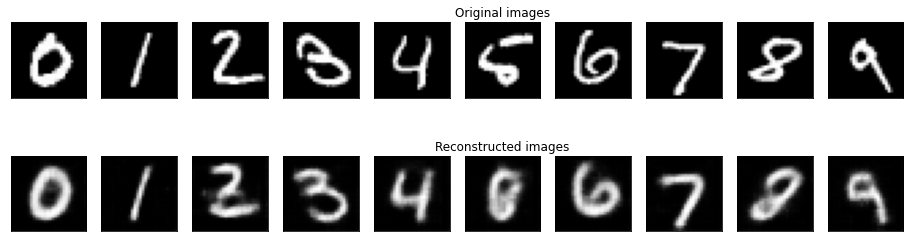

	 partial train loss (single batch): 8407.576172
	 partial train loss (single batch): 8397.826172
	 partial train loss (single batch): 8433.702148
	 partial train loss (single batch): 8538.825195
	 partial train loss (single batch): 8440.248047
	 partial train loss (single batch): 8708.541992
	 partial train loss (single batch): 8428.845703
	 partial train loss (single batch): 8058.862305
	 partial train loss (single batch): 8349.869141
	 partial train loss (single batch): 8237.291992
	 partial train loss (single batch): 8653.268555
	 partial train loss (single batch): 8398.859375
	 partial train loss (single batch): 8141.665527
	 partial train loss (single batch): 8776.110352
	 partial train loss (single batch): 8669.567383
	 partial train loss (single batch): 8397.714844
	 partial train loss (single batch): 7829.374023
	 partial train loss (single batch): 8355.839844
	 partial train loss (single batch): 8327.254883
	 partial train loss (single batch): 8148.888672
	 partial train loss

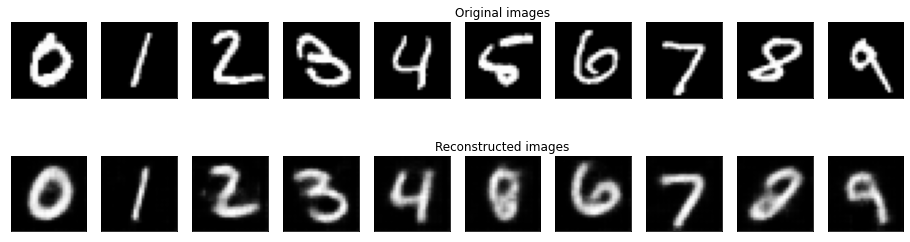

	 partial train loss (single batch): 8417.260742
	 partial train loss (single batch): 8316.647461
	 partial train loss (single batch): 8427.355469
	 partial train loss (single batch): 8469.897461
	 partial train loss (single batch): 8436.965820
	 partial train loss (single batch): 8640.410156
	 partial train loss (single batch): 8367.585938
	 partial train loss (single batch): 8092.885742
	 partial train loss (single batch): 8255.554688
	 partial train loss (single batch): 8316.247070
	 partial train loss (single batch): 8658.441406
	 partial train loss (single batch): 8415.445312
	 partial train loss (single batch): 8123.914551
	 partial train loss (single batch): 8751.248047
	 partial train loss (single batch): 8726.231445
	 partial train loss (single batch): 8319.812500
	 partial train loss (single batch): 7816.867676
	 partial train loss (single batch): 8324.699219
	 partial train loss (single batch): 8279.366211
	 partial train loss (single batch): 8099.268066
	 partial train loss

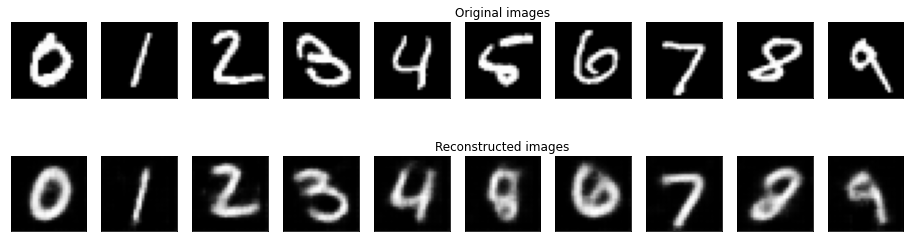

	 partial train loss (single batch): 8493.896484
	 partial train loss (single batch): 8389.167969
	 partial train loss (single batch): 8475.252930
	 partial train loss (single batch): 8398.896484
	 partial train loss (single batch): 8471.021484
	 partial train loss (single batch): 8670.255859
	 partial train loss (single batch): 8387.736328
	 partial train loss (single batch): 8018.703613
	 partial train loss (single batch): 8236.923828
	 partial train loss (single batch): 8229.370117
	 partial train loss (single batch): 8614.695312
	 partial train loss (single batch): 8432.369141
	 partial train loss (single batch): 8095.437012
	 partial train loss (single batch): 8723.214844
	 partial train loss (single batch): 8719.404297
	 partial train loss (single batch): 8358.478516
	 partial train loss (single batch): 7851.443359
	 partial train loss (single batch): 8364.932617
	 partial train loss (single batch): 8279.797852
	 partial train loss (single batch): 8122.671875
	 partial train loss

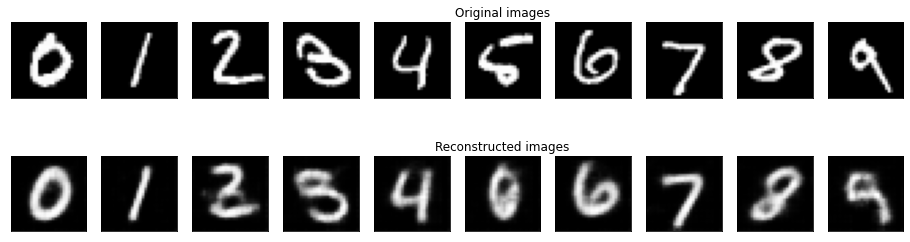

	 partial train loss (single batch): 8420.562500
	 partial train loss (single batch): 8407.894531
	 partial train loss (single batch): 8410.144531
	 partial train loss (single batch): 8421.264648
	 partial train loss (single batch): 8347.024414
	 partial train loss (single batch): 8620.563477
	 partial train loss (single batch): 8436.552734
	 partial train loss (single batch): 8066.669922
	 partial train loss (single batch): 8293.260742
	 partial train loss (single batch): 8212.664062
	 partial train loss (single batch): 8618.304688
	 partial train loss (single batch): 8335.335938
	 partial train loss (single batch): 8152.421387
	 partial train loss (single batch): 8719.044922
	 partial train loss (single batch): 8602.000000
	 partial train loss (single batch): 8383.674805
	 partial train loss (single batch): 7815.068848
	 partial train loss (single batch): 8372.970703
	 partial train loss (single batch): 8376.429688
	 partial train loss (single batch): 8058.390137
	 partial train loss

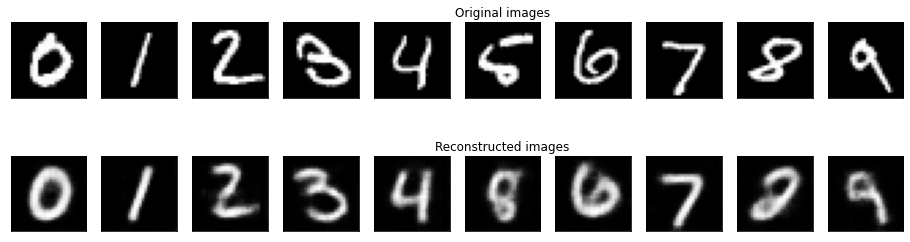

	 partial train loss (single batch): 8431.717773
	 partial train loss (single batch): 8363.291016
	 partial train loss (single batch): 8412.529297
	 partial train loss (single batch): 8508.189453
	 partial train loss (single batch): 8373.275391
	 partial train loss (single batch): 8622.386719
	 partial train loss (single batch): 8442.248047
	 partial train loss (single batch): 8096.837891
	 partial train loss (single batch): 8351.359375
	 partial train loss (single batch): 8224.630859
	 partial train loss (single batch): 8638.314453
	 partial train loss (single batch): 8421.583984
	 partial train loss (single batch): 8025.822266
	 partial train loss (single batch): 8671.517578
	 partial train loss (single batch): 8648.861328
	 partial train loss (single batch): 8371.750977
	 partial train loss (single batch): 7959.156250
	 partial train loss (single batch): 8265.074219
	 partial train loss (single batch): 8320.569336
	 partial train loss (single batch): 8086.937500
	 partial train loss

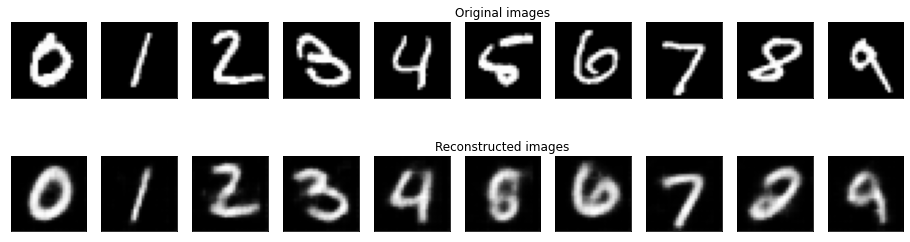

	 partial train loss (single batch): 8335.132812
	 partial train loss (single batch): 8352.962891
	 partial train loss (single batch): 8376.443359
	 partial train loss (single batch): 8442.429688
	 partial train loss (single batch): 8360.754883
	 partial train loss (single batch): 8669.120117
	 partial train loss (single batch): 8324.083984
	 partial train loss (single batch): 8027.796875
	 partial train loss (single batch): 8260.152344
	 partial train loss (single batch): 8225.100586
	 partial train loss (single batch): 8629.314453
	 partial train loss (single batch): 8350.841797
	 partial train loss (single batch): 8189.297852
	 partial train loss (single batch): 8671.806641
	 partial train loss (single batch): 8637.160156
	 partial train loss (single batch): 8385.583984
	 partial train loss (single batch): 7833.372070
	 partial train loss (single batch): 8324.690430
	 partial train loss (single batch): 8217.354492
	 partial train loss (single batch): 8116.117188
	 partial train loss

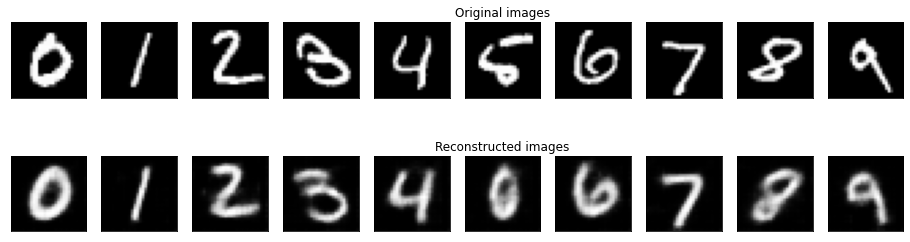

	 partial train loss (single batch): 8405.434570
	 partial train loss (single batch): 8408.569336
	 partial train loss (single batch): 8375.116211
	 partial train loss (single batch): 8478.017578
	 partial train loss (single batch): 8406.457031
	 partial train loss (single batch): 8643.056641
	 partial train loss (single batch): 8325.117188
	 partial train loss (single batch): 8020.580078
	 partial train loss (single batch): 8327.256836
	 partial train loss (single batch): 8222.839844
	 partial train loss (single batch): 8687.429688
	 partial train loss (single batch): 8358.970703
	 partial train loss (single batch): 8080.880859
	 partial train loss (single batch): 8722.113281
	 partial train loss (single batch): 8617.687500
	 partial train loss (single batch): 8293.706055
	 partial train loss (single batch): 7764.995117
	 partial train loss (single batch): 8356.767578
	 partial train loss (single batch): 8327.015625
	 partial train loss (single batch): 8075.808105
	 partial train loss

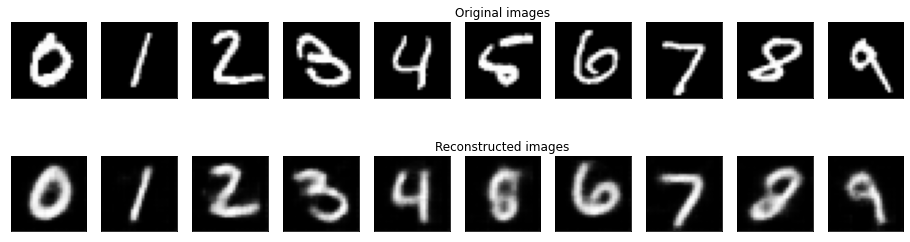

	 partial train loss (single batch): 8415.255859
	 partial train loss (single batch): 8354.691406
	 partial train loss (single batch): 8330.125000
	 partial train loss (single batch): 8409.212891
	 partial train loss (single batch): 8353.369141
	 partial train loss (single batch): 8604.273438
	 partial train loss (single batch): 8388.332031
	 partial train loss (single batch): 8017.739258
	 partial train loss (single batch): 8288.791016
	 partial train loss (single batch): 8274.408203
	 partial train loss (single batch): 8625.812500
	 partial train loss (single batch): 8362.878906
	 partial train loss (single batch): 8024.263184
	 partial train loss (single batch): 8714.383789
	 partial train loss (single batch): 8640.958008
	 partial train loss (single batch): 8359.666016
	 partial train loss (single batch): 7831.493652
	 partial train loss (single batch): 8295.252930
	 partial train loss (single batch): 8269.525391
	 partial train loss (single batch): 8080.291992
	 partial train loss

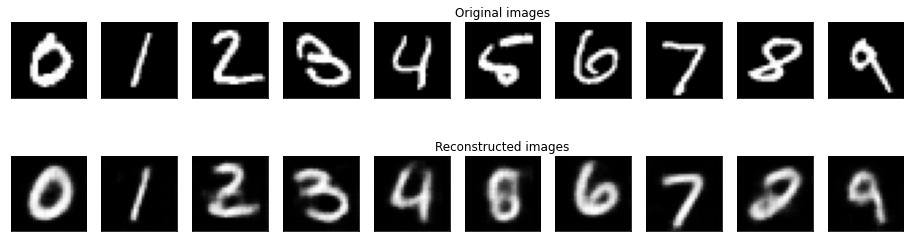

	 partial train loss (single batch): 8357.240234
	 partial train loss (single batch): 8324.661133
	 partial train loss (single batch): 8353.223633
	 partial train loss (single batch): 8344.500000
	 partial train loss (single batch): 8312.645508
	 partial train loss (single batch): 8566.999023
	 partial train loss (single batch): 8327.128906
	 partial train loss (single batch): 8018.531738
	 partial train loss (single batch): 8256.666992
	 partial train loss (single batch): 8196.996094
	 partial train loss (single batch): 8589.062500
	 partial train loss (single batch): 8374.957031
	 partial train loss (single batch): 8037.799805
	 partial train loss (single batch): 8583.322266
	 partial train loss (single batch): 8558.101562
	 partial train loss (single batch): 8320.509766
	 partial train loss (single batch): 7788.982422
	 partial train loss (single batch): 8289.810547
	 partial train loss (single batch): 8265.612305
	 partial train loss (single batch): 8031.202148
	 partial train loss

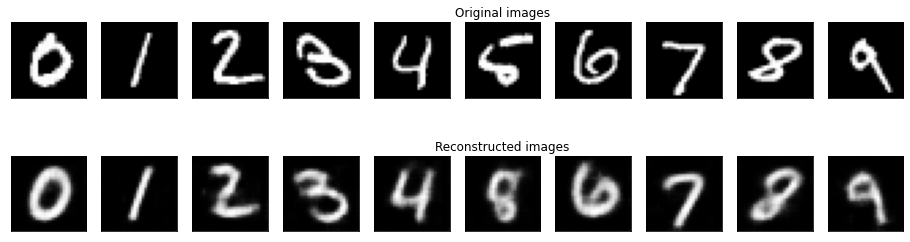

	 partial train loss (single batch): 8397.640625
	 partial train loss (single batch): 8229.878906
	 partial train loss (single batch): 8365.238281
	 partial train loss (single batch): 8399.625000
	 partial train loss (single batch): 8282.488281
	 partial train loss (single batch): 8646.224609
	 partial train loss (single batch): 8298.679688
	 partial train loss (single batch): 8094.506836
	 partial train loss (single batch): 8225.207031
	 partial train loss (single batch): 8226.526367
	 partial train loss (single batch): 8570.382812
	 partial train loss (single batch): 8378.697266
	 partial train loss (single batch): 7970.984375
	 partial train loss (single batch): 8665.181641
	 partial train loss (single batch): 8509.298828
	 partial train loss (single batch): 8298.671875
	 partial train loss (single batch): 7815.614746
	 partial train loss (single batch): 8328.488281
	 partial train loss (single batch): 8240.016602
	 partial train loss (single batch): 8056.630371
	 partial train loss

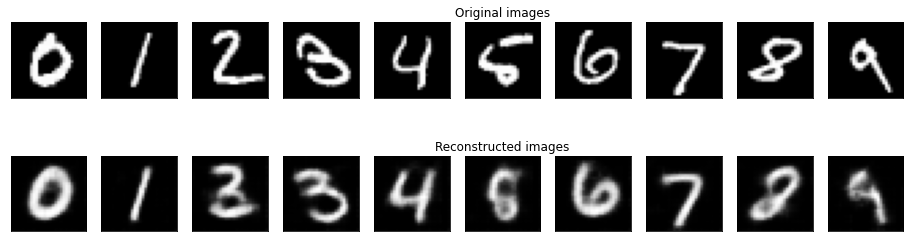

	 partial train loss (single batch): 8395.275391
	 partial train loss (single batch): 8348.855469
	 partial train loss (single batch): 8381.589844
	 partial train loss (single batch): 8404.812500
	 partial train loss (single batch): 8254.802734
	 partial train loss (single batch): 8584.240234
	 partial train loss (single batch): 8336.219727
	 partial train loss (single batch): 8018.071777
	 partial train loss (single batch): 8199.019531
	 partial train loss (single batch): 8160.421875
	 partial train loss (single batch): 8618.737305
	 partial train loss (single batch): 8403.785156
	 partial train loss (single batch): 7993.682129
	 partial train loss (single batch): 8616.540039
	 partial train loss (single batch): 8624.736328
	 partial train loss (single batch): 8264.865234
	 partial train loss (single batch): 7735.689453
	 partial train loss (single batch): 8336.345703
	 partial train loss (single batch): 8273.275391
	 partial train loss (single batch): 8069.906250
	 partial train loss

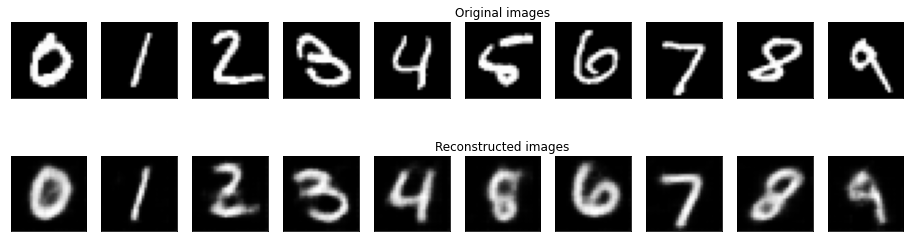

	 partial train loss (single batch): 8347.184570
	 partial train loss (single batch): 8318.193359
	 partial train loss (single batch): 8329.500000
	 partial train loss (single batch): 8425.103516
	 partial train loss (single batch): 8322.345703
	 partial train loss (single batch): 8526.295898
	 partial train loss (single batch): 8358.142578
	 partial train loss (single batch): 8033.557617
	 partial train loss (single batch): 8243.109375
	 partial train loss (single batch): 8199.949219
	 partial train loss (single batch): 8556.720703
	 partial train loss (single batch): 8385.710938
	 partial train loss (single batch): 8069.828613
	 partial train loss (single batch): 8610.441406
	 partial train loss (single batch): 8583.330078
	 partial train loss (single batch): 8283.480469
	 partial train loss (single batch): 7763.007812
	 partial train loss (single batch): 8236.142578
	 partial train loss (single batch): 8253.462891
	 partial train loss (single batch): 8044.175293
	 partial train loss

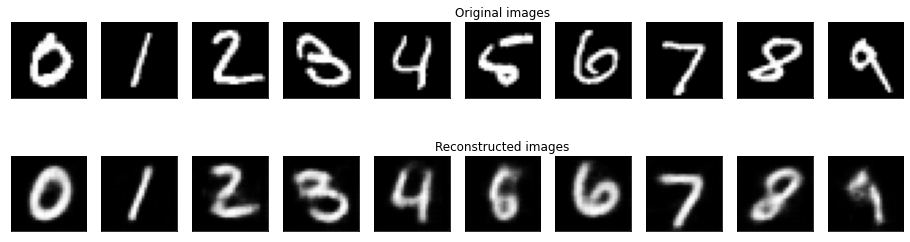

	 partial train loss (single batch): 8263.214844
	 partial train loss (single batch): 8264.564453
	 partial train loss (single batch): 8318.981445
	 partial train loss (single batch): 8486.947266
	 partial train loss (single batch): 8288.219727
	 partial train loss (single batch): 8538.574219
	 partial train loss (single batch): 8229.567383
	 partial train loss (single batch): 8000.511719
	 partial train loss (single batch): 8240.004883
	 partial train loss (single batch): 8103.094727
	 partial train loss (single batch): 8476.039062
	 partial train loss (single batch): 8295.392578
	 partial train loss (single batch): 8001.741211
	 partial train loss (single batch): 8631.822266
	 partial train loss (single batch): 8572.280273
	 partial train loss (single batch): 8276.916016
	 partial train loss (single batch): 7722.896484
	 partial train loss (single batch): 8253.121094
	 partial train loss (single batch): 8234.611328
	 partial train loss (single batch): 8007.770020
	 partial train loss

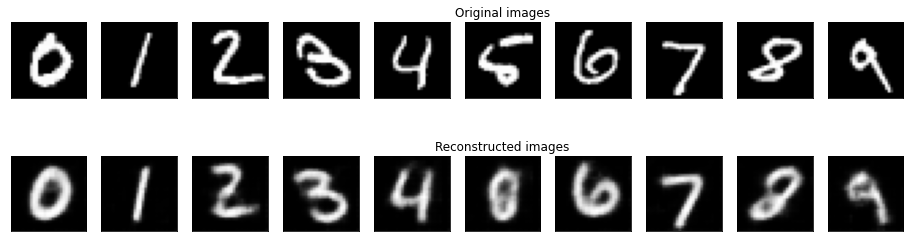

	 partial train loss (single batch): 8308.337891
	 partial train loss (single batch): 8282.618164
	 partial train loss (single batch): 8345.298828
	 partial train loss (single batch): 8403.763672
	 partial train loss (single batch): 8421.483398
	 partial train loss (single batch): 8555.192383
	 partial train loss (single batch): 8307.138672
	 partial train loss (single batch): 7941.395996
	 partial train loss (single batch): 8264.105469
	 partial train loss (single batch): 8141.466797
	 partial train loss (single batch): 8571.914062
	 partial train loss (single batch): 8301.083008
	 partial train loss (single batch): 7985.583984
	 partial train loss (single batch): 8684.714844
	 partial train loss (single batch): 8598.220703
	 partial train loss (single batch): 8329.440430
	 partial train loss (single batch): 7745.532227
	 partial train loss (single batch): 8252.619141
	 partial train loss (single batch): 8252.375000
	 partial train loss (single batch): 8085.823242
	 partial train loss

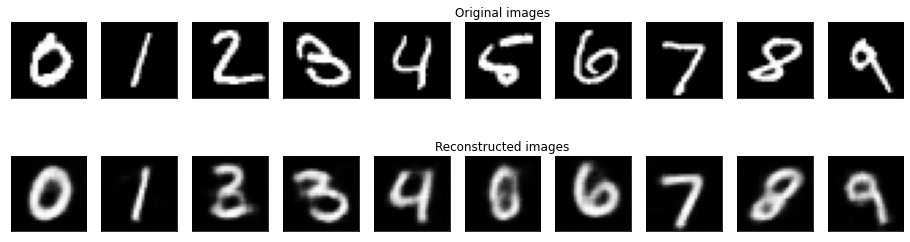

	 partial train loss (single batch): 8378.777344
	 partial train loss (single batch): 8267.822266
	 partial train loss (single batch): 8295.859375
	 partial train loss (single batch): 8381.102539
	 partial train loss (single batch): 8308.783203
	 partial train loss (single batch): 8528.453125
	 partial train loss (single batch): 8324.506836
	 partial train loss (single batch): 7882.442871
	 partial train loss (single batch): 8214.787109
	 partial train loss (single batch): 8050.352539
	 partial train loss (single batch): 8478.111328
	 partial train loss (single batch): 8329.191406
	 partial train loss (single batch): 8034.219238
	 partial train loss (single batch): 8593.386719
	 partial train loss (single batch): 8569.140625
	 partial train loss (single batch): 8235.353516
	 partial train loss (single batch): 7739.472656
	 partial train loss (single batch): 8253.228516
	 partial train loss (single batch): 8218.856445
	 partial train loss (single batch): 8058.628418
	 partial train loss

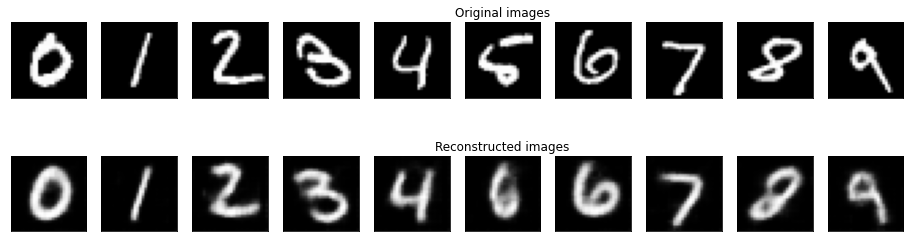

	 partial train loss (single batch): 8358.128906
	 partial train loss (single batch): 8200.414062
	 partial train loss (single batch): 8250.671875
	 partial train loss (single batch): 8377.180664
	 partial train loss (single batch): 8280.516602
	 partial train loss (single batch): 8513.683594
	 partial train loss (single batch): 8318.117188
	 partial train loss (single batch): 7926.337891
	 partial train loss (single batch): 8179.734375
	 partial train loss (single batch): 8118.640137
	 partial train loss (single batch): 8485.988281
	 partial train loss (single batch): 8262.469727
	 partial train loss (single batch): 7963.611328
	 partial train loss (single batch): 8598.886719
	 partial train loss (single batch): 8556.066406
	 partial train loss (single batch): 8249.959961
	 partial train loss (single batch): 7735.582031
	 partial train loss (single batch): 8229.164062
	 partial train loss (single batch): 8255.511719
	 partial train loss (single batch): 7937.219238
	 partial train loss

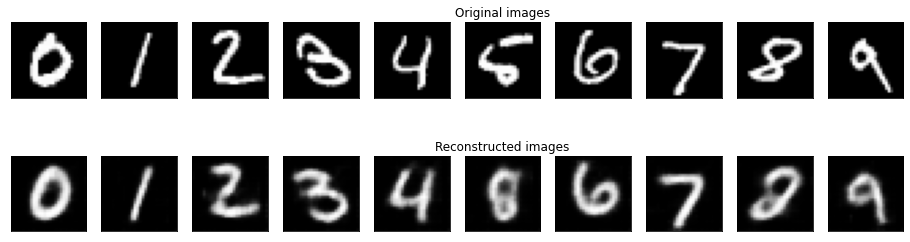

	 partial train loss (single batch): 8321.291016
	 partial train loss (single batch): 8263.982422
	 partial train loss (single batch): 8307.328125
	 partial train loss (single batch): 8354.698242
	 partial train loss (single batch): 8306.036133
	 partial train loss (single batch): 8524.942383
	 partial train loss (single batch): 8267.615234
	 partial train loss (single batch): 7941.585449
	 partial train loss (single batch): 8215.705078
	 partial train loss (single batch): 8057.309570
	 partial train loss (single batch): 8415.297852
	 partial train loss (single batch): 8243.722656
	 partial train loss (single batch): 7941.418945
	 partial train loss (single batch): 8586.892578
	 partial train loss (single batch): 8499.066406
	 partial train loss (single batch): 8272.857422
	 partial train loss (single batch): 7705.064941
	 partial train loss (single batch): 8325.006836
	 partial train loss (single batch): 8160.716797
	 partial train loss (single batch): 8006.040527
	 partial train loss

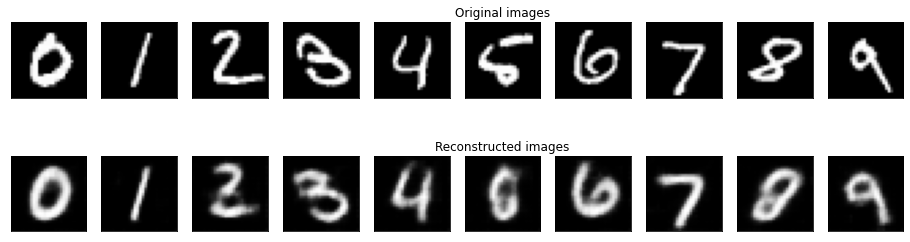

	 partial train loss (single batch): 8274.517578
	 partial train loss (single batch): 8216.647461
	 partial train loss (single batch): 8238.748047
	 partial train loss (single batch): 8305.474609
	 partial train loss (single batch): 8237.771484
	 partial train loss (single batch): 8488.777344
	 partial train loss (single batch): 8189.482910
	 partial train loss (single batch): 8006.596680
	 partial train loss (single batch): 8254.950195
	 partial train loss (single batch): 8139.393555
	 partial train loss (single batch): 8462.432617
	 partial train loss (single batch): 8241.443359
	 partial train loss (single batch): 7960.676758
	 partial train loss (single batch): 8546.791016
	 partial train loss (single batch): 8482.938477
	 partial train loss (single batch): 8225.449219
	 partial train loss (single batch): 7748.754883
	 partial train loss (single batch): 8199.889648
	 partial train loss (single batch): 8248.205078
	 partial train loss (single batch): 7968.955566
	 partial train loss

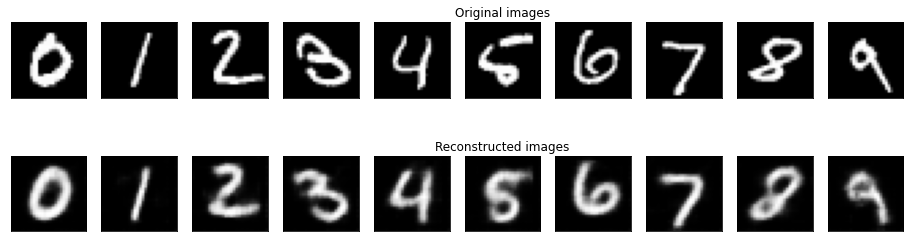

	 partial train loss (single batch): 8263.330078
	 partial train loss (single batch): 8197.328125
	 partial train loss (single batch): 8286.030273
	 partial train loss (single batch): 8401.770508
	 partial train loss (single batch): 8210.876953
	 partial train loss (single batch): 8498.035156
	 partial train loss (single batch): 8340.991211
	 partial train loss (single batch): 7939.796875
	 partial train loss (single batch): 8166.990723
	 partial train loss (single batch): 8103.825195
	 partial train loss (single batch): 8424.273438
	 partial train loss (single batch): 8290.199219
	 partial train loss (single batch): 7849.090820
	 partial train loss (single batch): 8533.363281
	 partial train loss (single batch): 8515.742188
	 partial train loss (single batch): 8256.739258
	 partial train loss (single batch): 7741.824219
	 partial train loss (single batch): 8221.199219
	 partial train loss (single batch): 8154.098633
	 partial train loss (single batch): 8051.442383
	 partial train loss

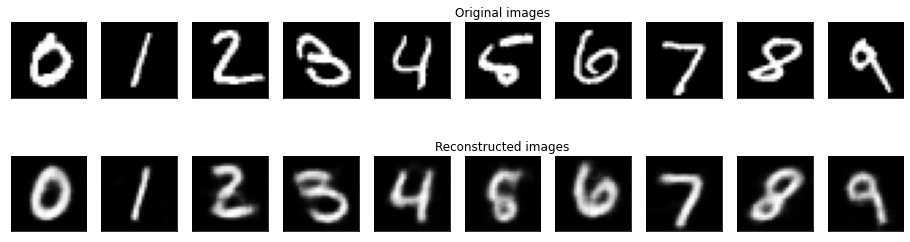

	 partial train loss (single batch): 8222.575195
	 partial train loss (single batch): 8230.070312
	 partial train loss (single batch): 8355.868164
	 partial train loss (single batch): 8299.992188
	 partial train loss (single batch): 8192.937500
	 partial train loss (single batch): 8561.126953
	 partial train loss (single batch): 8294.773438
	 partial train loss (single batch): 7892.392578
	 partial train loss (single batch): 8134.870117
	 partial train loss (single batch): 8096.053223
	 partial train loss (single batch): 8462.564453
	 partial train loss (single batch): 8260.626953
	 partial train loss (single batch): 7981.536621
	 partial train loss (single batch): 8514.587891
	 partial train loss (single batch): 8477.205078
	 partial train loss (single batch): 8337.409180
	 partial train loss (single batch): 7751.822754
	 partial train loss (single batch): 8182.473633
	 partial train loss (single batch): 8205.812500
	 partial train loss (single batch): 8026.725586
	 partial train loss

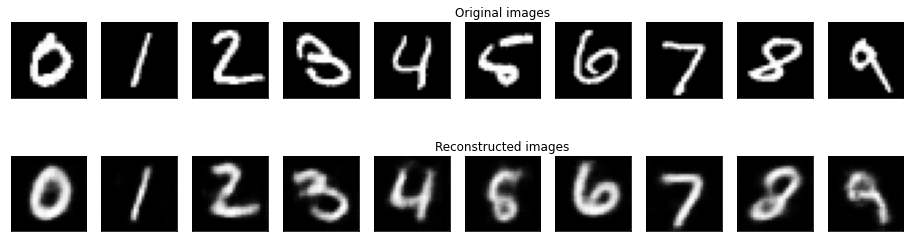

	 partial train loss (single batch): 8315.680664
	 partial train loss (single batch): 8249.170898
	 partial train loss (single batch): 8268.797852
	 partial train loss (single batch): 8316.788086
	 partial train loss (single batch): 8213.013672
	 partial train loss (single batch): 8530.614258
	 partial train loss (single batch): 8261.386719
	 partial train loss (single batch): 7895.063477
	 partial train loss (single batch): 8182.867188
	 partial train loss (single batch): 8129.995605
	 partial train loss (single batch): 8453.435547
	 partial train loss (single batch): 8249.419922
	 partial train loss (single batch): 7933.916504
	 partial train loss (single batch): 8495.660156
	 partial train loss (single batch): 8569.980469
	 partial train loss (single batch): 8222.214844
	 partial train loss (single batch): 7672.125977
	 partial train loss (single batch): 8155.180664
	 partial train loss (single batch): 8229.627930
	 partial train loss (single batch): 8015.240234
	 partial train loss

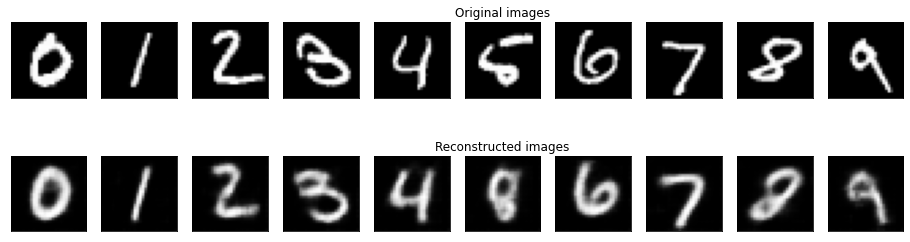

	 partial train loss (single batch): 8260.060547
	 partial train loss (single batch): 8198.814453
	 partial train loss (single batch): 8253.480469
	 partial train loss (single batch): 8381.979492
	 partial train loss (single batch): 8279.267578
	 partial train loss (single batch): 8449.656250
	 partial train loss (single batch): 8245.251953
	 partial train loss (single batch): 8002.137695
	 partial train loss (single batch): 8195.486328
	 partial train loss (single batch): 8196.699219
	 partial train loss (single batch): 8484.511719
	 partial train loss (single batch): 8235.542969
	 partial train loss (single batch): 7943.756348
	 partial train loss (single batch): 8592.671875
	 partial train loss (single batch): 8481.426758
	 partial train loss (single batch): 8219.943359
	 partial train loss (single batch): 7776.247070
	 partial train loss (single batch): 8231.902344
	 partial train loss (single batch): 8207.067383
	 partial train loss (single batch): 8024.653809
	 partial train loss

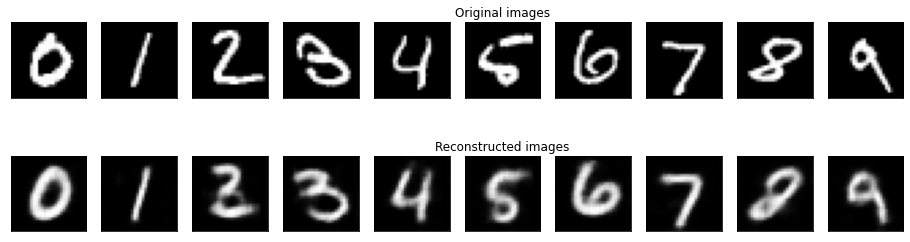

	 partial train loss (single batch): 8301.773438
	 partial train loss (single batch): 8223.075195
	 partial train loss (single batch): 8165.709473
	 partial train loss (single batch): 8289.009766
	 partial train loss (single batch): 8220.554688
	 partial train loss (single batch): 8456.252930
	 partial train loss (single batch): 8287.399414
	 partial train loss (single batch): 7942.099121
	 partial train loss (single batch): 8137.053711
	 partial train loss (single batch): 8123.194336
	 partial train loss (single batch): 8428.212891
	 partial train loss (single batch): 8304.490234
	 partial train loss (single batch): 7937.190918
	 partial train loss (single batch): 8504.723633
	 partial train loss (single batch): 8516.435547
	 partial train loss (single batch): 8311.514648
	 partial train loss (single batch): 7668.640625
	 partial train loss (single batch): 8197.382812
	 partial train loss (single batch): 8201.571289
	 partial train loss (single batch): 7932.112793
	 partial train loss

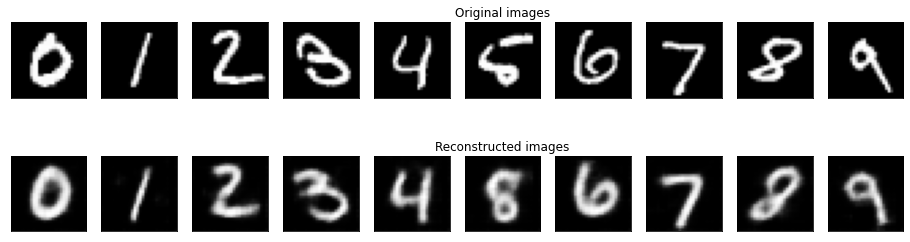

	 partial train loss (single batch): 8224.133789
	 partial train loss (single batch): 8214.207031
	 partial train loss (single batch): 8178.987305
	 partial train loss (single batch): 8334.660156
	 partial train loss (single batch): 8265.881836
	 partial train loss (single batch): 8428.726562
	 partial train loss (single batch): 8279.560547
	 partial train loss (single batch): 7909.881348
	 partial train loss (single batch): 8131.182617
	 partial train loss (single batch): 8018.104004
	 partial train loss (single batch): 8444.431641
	 partial train loss (single batch): 8183.230469
	 partial train loss (single batch): 7876.848633
	 partial train loss (single batch): 8480.447266
	 partial train loss (single batch): 8528.080078
	 partial train loss (single batch): 8235.925781
	 partial train loss (single batch): 7675.925781
	 partial train loss (single batch): 8260.350586
	 partial train loss (single batch): 8143.320312
	 partial train loss (single batch): 7935.241211
	 partial train loss

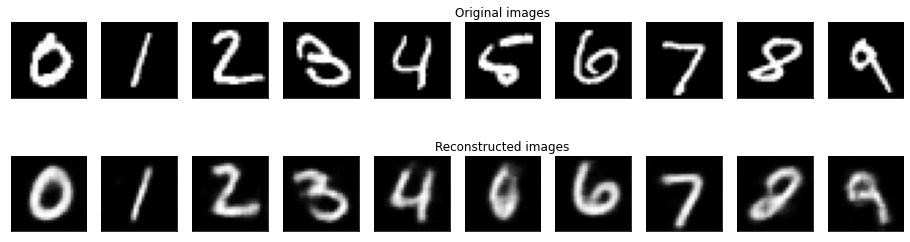

	 partial train loss (single batch): 8310.761719
	 partial train loss (single batch): 8132.815918
	 partial train loss (single batch): 8221.062500
	 partial train loss (single batch): 8341.988281
	 partial train loss (single batch): 8236.178711
	 partial train loss (single batch): 8462.224609
	 partial train loss (single batch): 8157.582031
	 partial train loss (single batch): 7914.856445
	 partial train loss (single batch): 8136.565430
	 partial train loss (single batch): 8103.071289
	 partial train loss (single batch): 8430.528320
	 partial train loss (single batch): 8238.491211
	 partial train loss (single batch): 7856.599609
	 partial train loss (single batch): 8460.958008
	 partial train loss (single batch): 8465.291016
	 partial train loss (single batch): 8229.344727
	 partial train loss (single batch): 7707.655273
	 partial train loss (single batch): 8204.258789
	 partial train loss (single batch): 8214.976562
	 partial train loss (single batch): 7976.941406
	 partial train loss

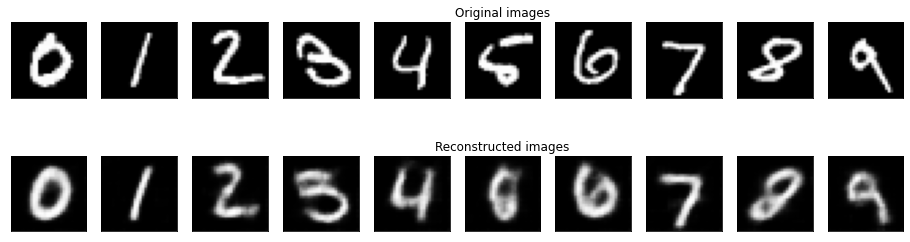

	 partial train loss (single batch): 8240.257812
	 partial train loss (single batch): 8194.039062
	 partial train loss (single batch): 8190.945312
	 partial train loss (single batch): 8318.411133
	 partial train loss (single batch): 8223.121094
	 partial train loss (single batch): 8395.425781
	 partial train loss (single batch): 8308.877930
	 partial train loss (single batch): 7913.616211
	 partial train loss (single batch): 8142.316406
	 partial train loss (single batch): 8083.550781
	 partial train loss (single batch): 8412.789062
	 partial train loss (single batch): 8263.335938
	 partial train loss (single batch): 7872.306641
	 partial train loss (single batch): 8444.554688
	 partial train loss (single batch): 8500.164062
	 partial train loss (single batch): 8248.525391
	 partial train loss (single batch): 7737.393555
	 partial train loss (single batch): 8164.405273
	 partial train loss (single batch): 8235.708984
	 partial train loss (single batch): 8053.588867
	 partial train loss

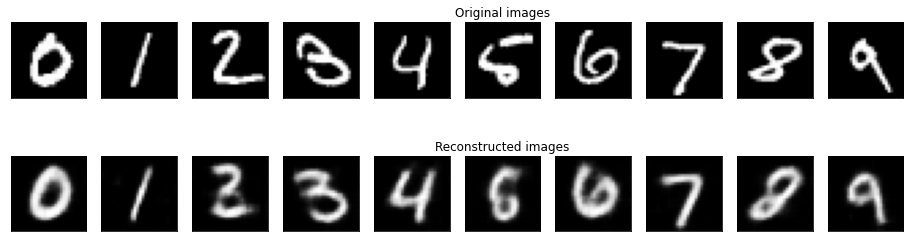

	 partial train loss (single batch): 8244.671875
	 partial train loss (single batch): 8210.738281
	 partial train loss (single batch): 8174.403809
	 partial train loss (single batch): 8295.412109
	 partial train loss (single batch): 8188.912109
	 partial train loss (single batch): 8477.585938
	 partial train loss (single batch): 8214.144531
	 partial train loss (single batch): 7897.732910
	 partial train loss (single batch): 8127.162109
	 partial train loss (single batch): 8064.733398
	 partial train loss (single batch): 8381.288086
	 partial train loss (single batch): 8217.201172
	 partial train loss (single batch): 7859.658203
	 partial train loss (single batch): 8543.556641
	 partial train loss (single batch): 8454.013672
	 partial train loss (single batch): 8170.562012
	 partial train loss (single batch): 7674.875488
	 partial train loss (single batch): 8073.928711
	 partial train loss (single batch): 8128.571289
	 partial train loss (single batch): 7919.773438
	 partial train loss

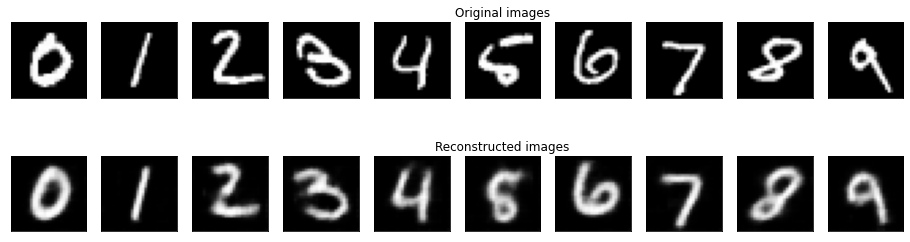

	 partial train loss (single batch): 8246.809570
	 partial train loss (single batch): 8170.555664
	 partial train loss (single batch): 8209.870117
	 partial train loss (single batch): 8324.960938
	 partial train loss (single batch): 8243.305664
	 partial train loss (single batch): 8521.502930
	 partial train loss (single batch): 8276.123047
	 partial train loss (single batch): 7923.914062
	 partial train loss (single batch): 8209.366211
	 partial train loss (single batch): 8100.711426
	 partial train loss (single batch): 8417.568359
	 partial train loss (single batch): 8276.226562
	 partial train loss (single batch): 7935.796387
	 partial train loss (single batch): 8480.162109
	 partial train loss (single batch): 8439.513672
	 partial train loss (single batch): 8276.107422
	 partial train loss (single batch): 7688.708008
	 partial train loss (single batch): 8239.834961
	 partial train loss (single batch): 8150.059082
	 partial train loss (single batch): 7975.137695
	 partial train loss

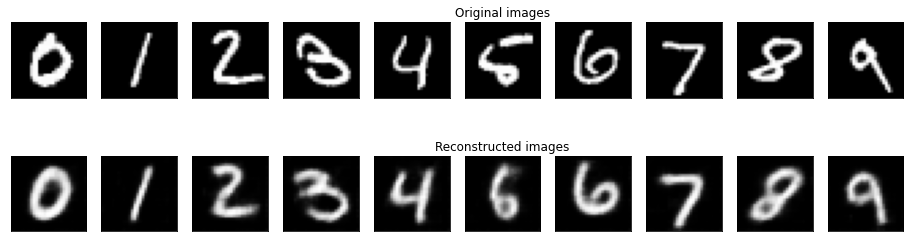

	 partial train loss (single batch): 8181.829590
	 partial train loss (single batch): 8238.630859
	 partial train loss (single batch): 8123.702637
	 partial train loss (single batch): 8280.713867
	 partial train loss (single batch): 8155.869141
	 partial train loss (single batch): 8524.821289
	 partial train loss (single batch): 8231.577148
	 partial train loss (single batch): 7813.836914
	 partial train loss (single batch): 8140.340820
	 partial train loss (single batch): 8010.244141
	 partial train loss (single batch): 8414.342773
	 partial train loss (single batch): 8174.843262
	 partial train loss (single batch): 7871.010742
	 partial train loss (single batch): 8506.011719
	 partial train loss (single batch): 8442.589844
	 partial train loss (single batch): 8140.825195
	 partial train loss (single batch): 7675.642090
	 partial train loss (single batch): 8234.167969
	 partial train loss (single batch): 8182.807129
	 partial train loss (single batch): 7924.614746
	 partial train loss

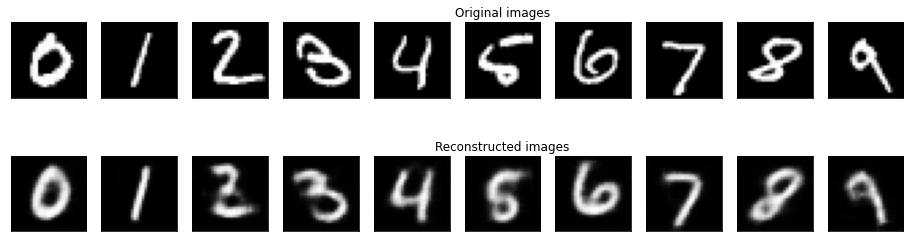

	 partial train loss (single batch): 8231.352539
	 partial train loss (single batch): 8189.399414
	 partial train loss (single batch): 8222.916016
	 partial train loss (single batch): 8297.308594
	 partial train loss (single batch): 8252.897461
	 partial train loss (single batch): 8403.304688
	 partial train loss (single batch): 8181.409668
	 partial train loss (single batch): 7830.563477
	 partial train loss (single batch): 8120.172852
	 partial train loss (single batch): 8074.940918
	 partial train loss (single batch): 8464.618164
	 partial train loss (single batch): 8170.272461
	 partial train loss (single batch): 7910.636719
	 partial train loss (single batch): 8465.294922
	 partial train loss (single batch): 8456.892578
	 partial train loss (single batch): 8125.097168
	 partial train loss (single batch): 7711.669922
	 partial train loss (single batch): 8225.964844
	 partial train loss (single batch): 8096.490234
	 partial train loss (single batch): 8007.414062
	 partial train loss

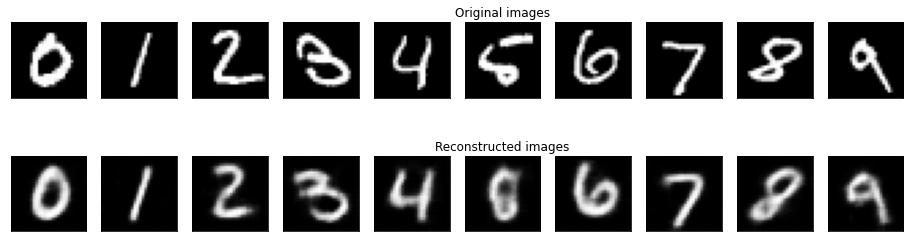

	 partial train loss (single batch): 8252.524414
	 partial train loss (single batch): 8136.491211
	 partial train loss (single batch): 8200.105469
	 partial train loss (single batch): 8304.369141
	 partial train loss (single batch): 8199.998047
	 partial train loss (single batch): 8432.296875
	 partial train loss (single batch): 8195.503906
	 partial train loss (single batch): 7868.187988
	 partial train loss (single batch): 8163.133301
	 partial train loss (single batch): 8064.499512
	 partial train loss (single batch): 8462.699219
	 partial train loss (single batch): 8181.508789
	 partial train loss (single batch): 7952.908203
	 partial train loss (single batch): 8440.375000
	 partial train loss (single batch): 8406.958008
	 partial train loss (single batch): 8216.986328
	 partial train loss (single batch): 7611.499023
	 partial train loss (single batch): 8154.498535
	 partial train loss (single batch): 8146.177246
	 partial train loss (single batch): 7979.660156
	 partial train loss

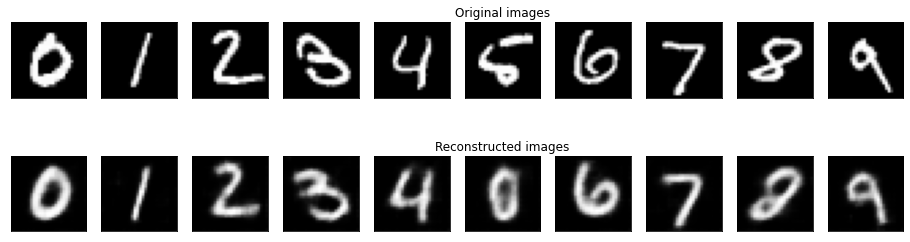

	 partial train loss (single batch): 8205.259766
	 partial train loss (single batch): 8104.375000
	 partial train loss (single batch): 8240.759766
	 partial train loss (single batch): 8259.140625
	 partial train loss (single batch): 8241.259766
	 partial train loss (single batch): 8479.084961
	 partial train loss (single batch): 8161.910645
	 partial train loss (single batch): 7798.924805
	 partial train loss (single batch): 8128.949707
	 partial train loss (single batch): 8012.750000
	 partial train loss (single batch): 8355.558594
	 partial train loss (single batch): 8204.245117
	 partial train loss (single batch): 7852.983398
	 partial train loss (single batch): 8489.924805
	 partial train loss (single batch): 8520.396484
	 partial train loss (single batch): 8229.446289
	 partial train loss (single batch): 7630.962891
	 partial train loss (single batch): 8204.574219
	 partial train loss (single batch): 8160.889160
	 partial train loss (single batch): 7900.683594
	 partial train loss

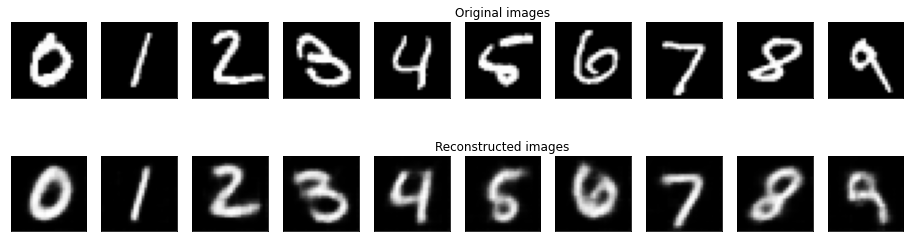

	 partial train loss (single batch): 8163.354004
	 partial train loss (single batch): 8107.952148
	 partial train loss (single batch): 8184.110352
	 partial train loss (single batch): 8351.109375
	 partial train loss (single batch): 8217.216797
	 partial train loss (single batch): 8392.934570
	 partial train loss (single batch): 8153.484375
	 partial train loss (single batch): 7865.430664
	 partial train loss (single batch): 8166.798828
	 partial train loss (single batch): 8026.868164
	 partial train loss (single batch): 8477.659180
	 partial train loss (single batch): 8222.573242
	 partial train loss (single batch): 7837.220703
	 partial train loss (single batch): 8502.759766
	 partial train loss (single batch): 8453.543945
	 partial train loss (single batch): 8194.628906
	 partial train loss (single batch): 7584.639160
	 partial train loss (single batch): 8143.524414
	 partial train loss (single batch): 8151.136719
	 partial train loss (single batch): 7956.147461
	 partial train loss

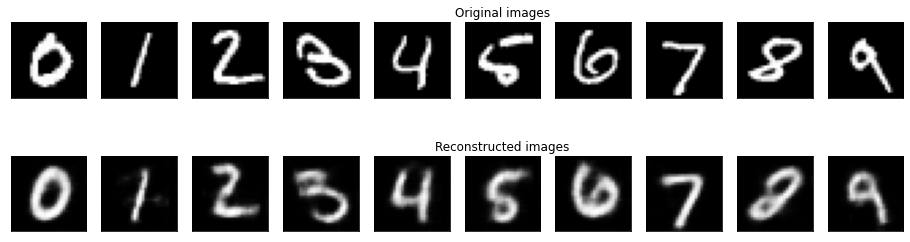

	 partial train loss (single batch): 8168.288086
	 partial train loss (single batch): 8171.885254
	 partial train loss (single batch): 8164.804199
	 partial train loss (single batch): 8296.431641
	 partial train loss (single batch): 8217.262695
	 partial train loss (single batch): 8360.183594
	 partial train loss (single batch): 8156.869141
	 partial train loss (single batch): 7809.916016
	 partial train loss (single batch): 8075.644531
	 partial train loss (single batch): 7973.627441
	 partial train loss (single batch): 8456.444336
	 partial train loss (single batch): 8130.862305
	 partial train loss (single batch): 7849.692383
	 partial train loss (single batch): 8442.335938
	 partial train loss (single batch): 8467.321289
	 partial train loss (single batch): 8241.736328
	 partial train loss (single batch): 7610.767090
	 partial train loss (single batch): 8131.845215
	 partial train loss (single batch): 8153.698242
	 partial train loss (single batch): 7930.276855
	 partial train loss

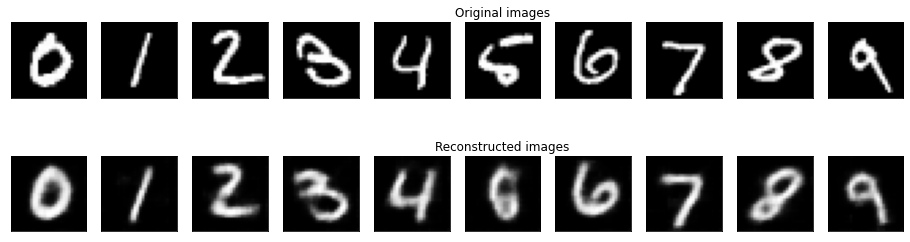

	 partial train loss (single batch): 8281.012695
	 partial train loss (single batch): 8176.502930
	 partial train loss (single batch): 8147.938965
	 partial train loss (single batch): 8287.471680
	 partial train loss (single batch): 8178.772461
	 partial train loss (single batch): 8455.789062
	 partial train loss (single batch): 8174.514648
	 partial train loss (single batch): 7817.570801
	 partial train loss (single batch): 8137.098633
	 partial train loss (single batch): 8035.990234
	 partial train loss (single batch): 8404.576172
	 partial train loss (single batch): 8169.746094
	 partial train loss (single batch): 7843.339844
	 partial train loss (single batch): 8530.105469
	 partial train loss (single batch): 8492.819336
	 partial train loss (single batch): 8189.067871
	 partial train loss (single batch): 7639.703613
	 partial train loss (single batch): 8144.090820
	 partial train loss (single batch): 8081.315918
	 partial train loss (single batch): 7893.688965
	 partial train loss

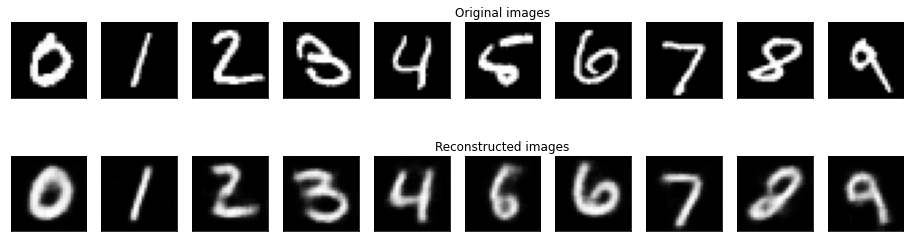

	 partial train loss (single batch): 8206.897461
	 partial train loss (single batch): 8147.157227
	 partial train loss (single batch): 8190.791016
	 partial train loss (single batch): 8251.359375
	 partial train loss (single batch): 8140.632812
	 partial train loss (single batch): 8374.521484
	 partial train loss (single batch): 8175.905273
	 partial train loss (single batch): 7811.058105
	 partial train loss (single batch): 8017.491699
	 partial train loss (single batch): 8012.978516
	 partial train loss (single batch): 8348.850586
	 partial train loss (single batch): 8209.659180
	 partial train loss (single batch): 7805.658203
	 partial train loss (single batch): 8525.691406
	 partial train loss (single batch): 8478.064453
	 partial train loss (single batch): 8209.662109
	 partial train loss (single batch): 7616.160156
	 partial train loss (single batch): 8137.986328
	 partial train loss (single batch): 8166.891602
	 partial train loss (single batch): 7922.908203
	 partial train loss

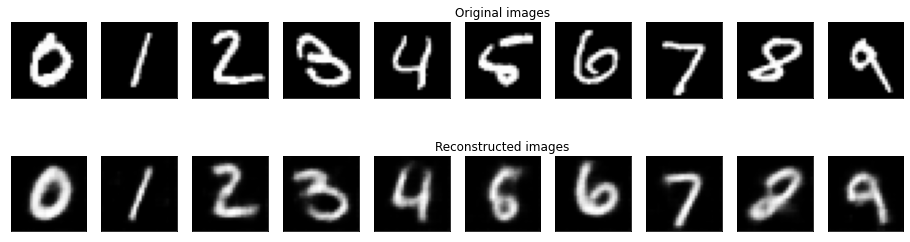

	 partial train loss (single batch): 8186.550293
	 partial train loss (single batch): 8188.917480
	 partial train loss (single batch): 8105.107422
	 partial train loss (single batch): 8251.431641
	 partial train loss (single batch): 8198.364258
	 partial train loss (single batch): 8461.880859
	 partial train loss (single batch): 8202.271484
	 partial train loss (single batch): 7862.841797
	 partial train loss (single batch): 8104.215332
	 partial train loss (single batch): 8013.733398
	 partial train loss (single batch): 8462.093750
	 partial train loss (single batch): 8157.288086
	 partial train loss (single batch): 7830.864258
	 partial train loss (single batch): 8459.593750
	 partial train loss (single batch): 8427.940430
	 partial train loss (single batch): 8147.925293
	 partial train loss (single batch): 7641.501465
	 partial train loss (single batch): 8132.780273
	 partial train loss (single batch): 8204.469727
	 partial train loss (single batch): 7942.837891
	 partial train loss

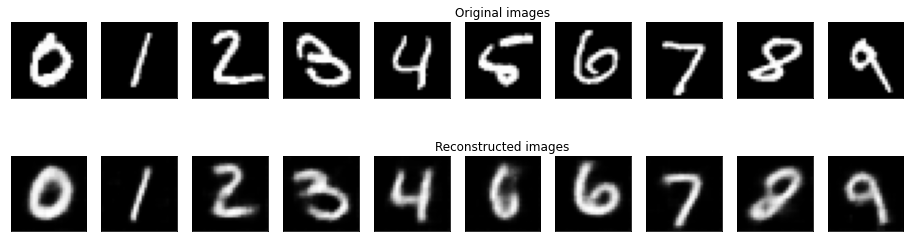

	 partial train loss (single batch): 8183.715820
	 partial train loss (single batch): 8186.199707
	 partial train loss (single batch): 8163.066895
	 partial train loss (single batch): 8233.197266
	 partial train loss (single batch): 8100.349609
	 partial train loss (single batch): 8457.248047
	 partial train loss (single batch): 8178.884766
	 partial train loss (single batch): 7857.881836
	 partial train loss (single batch): 8136.835449
	 partial train loss (single batch): 8061.723633
	 partial train loss (single batch): 8412.664062
	 partial train loss (single batch): 8257.416016
	 partial train loss (single batch): 7872.739746
	 partial train loss (single batch): 8458.425781
	 partial train loss (single batch): 8452.423828
	 partial train loss (single batch): 8242.293945
	 partial train loss (single batch): 7632.186523
	 partial train loss (single batch): 8100.055664
	 partial train loss (single batch): 8132.677246
	 partial train loss (single batch): 7974.139648
	 partial train loss

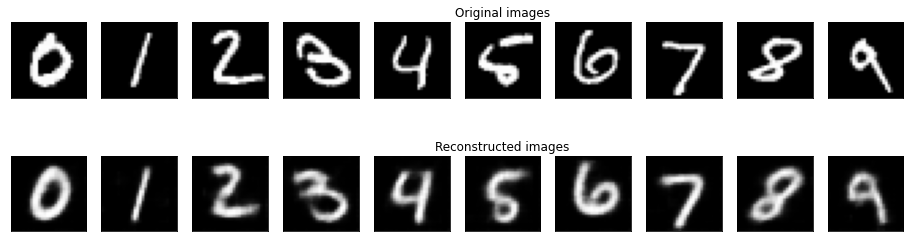

	 partial train loss (single batch): 8271.412109
	 partial train loss (single batch): 8114.962891
	 partial train loss (single batch): 8112.825195
	 partial train loss (single batch): 8279.769531
	 partial train loss (single batch): 8120.499023
	 partial train loss (single batch): 8383.362305
	 partial train loss (single batch): 8144.916504
	 partial train loss (single batch): 7830.175293
	 partial train loss (single batch): 8108.889648
	 partial train loss (single batch): 8084.257812
	 partial train loss (single batch): 8362.389648
	 partial train loss (single batch): 8190.334961
	 partial train loss (single batch): 7830.377441
	 partial train loss (single batch): 8481.808594
	 partial train loss (single batch): 8436.007812
	 partial train loss (single batch): 8134.567383
	 partial train loss (single batch): 7637.801270
	 partial train loss (single batch): 8122.730957
	 partial train loss (single batch): 8103.475586
	 partial train loss (single batch): 7947.256348
	 partial train loss

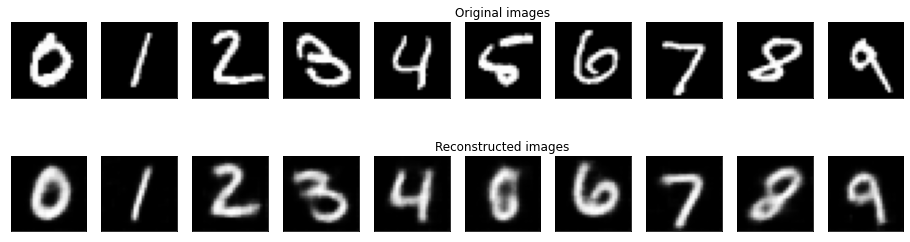

	 partial train loss (single batch): 8169.416016
	 partial train loss (single batch): 8132.764648
	 partial train loss (single batch): 8070.126465
	 partial train loss (single batch): 8309.552734
	 partial train loss (single batch): 8205.437500
	 partial train loss (single batch): 8377.701172
	 partial train loss (single batch): 8099.233398
	 partial train loss (single batch): 7830.070312
	 partial train loss (single batch): 8049.195801
	 partial train loss (single batch): 8030.213867
	 partial train loss (single batch): 8402.972656
	 partial train loss (single batch): 8144.610840
	 partial train loss (single batch): 7765.919922
	 partial train loss (single batch): 8406.464844
	 partial train loss (single batch): 8442.677734
	 partial train loss (single batch): 8181.166016
	 partial train loss (single batch): 7707.831543
	 partial train loss (single batch): 8082.245117
	 partial train loss (single batch): 8106.696777
	 partial train loss (single batch): 7890.702637
	 partial train loss

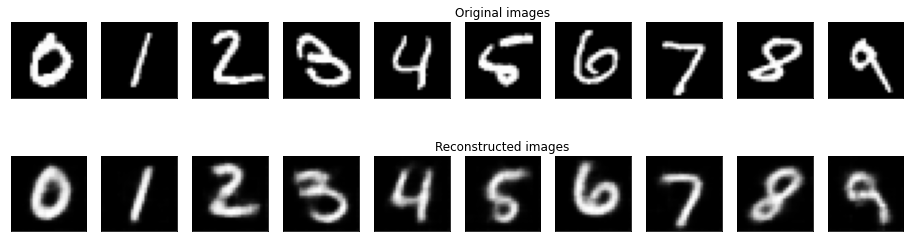

	 partial train loss (single batch): 8209.970703
	 partial train loss (single batch): 8103.493164
	 partial train loss (single batch): 8140.834473
	 partial train loss (single batch): 8233.781250
	 partial train loss (single batch): 8250.455078
	 partial train loss (single batch): 8405.220703
	 partial train loss (single batch): 8166.996094
	 partial train loss (single batch): 7772.801758
	 partial train loss (single batch): 8055.073242
	 partial train loss (single batch): 8025.814941
	 partial train loss (single batch): 8322.302734
	 partial train loss (single batch): 8200.779297
	 partial train loss (single batch): 7816.408203
	 partial train loss (single batch): 8440.866211
	 partial train loss (single batch): 8374.907227
	 partial train loss (single batch): 8135.987305
	 partial train loss (single batch): 7608.441406
	 partial train loss (single batch): 8121.997559
	 partial train loss (single batch): 8080.570312
	 partial train loss (single batch): 7888.094727
	 partial train loss

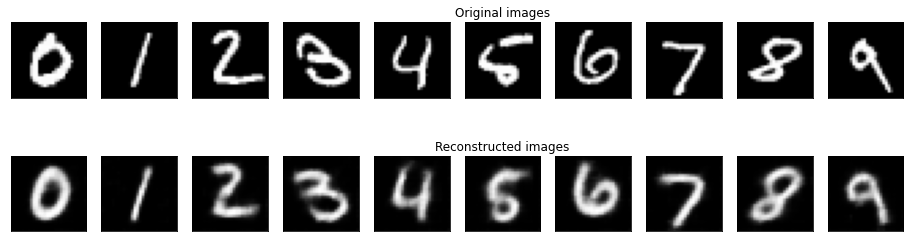

	 partial train loss (single batch): 8159.788086
	 partial train loss (single batch): 8144.436035
	 partial train loss (single batch): 8118.298340
	 partial train loss (single batch): 8214.435547
	 partial train loss (single batch): 8121.067383
	 partial train loss (single batch): 8342.109375
	 partial train loss (single batch): 8195.454102
	 partial train loss (single batch): 7761.976074
	 partial train loss (single batch): 8110.709473
	 partial train loss (single batch): 8003.033691
	 partial train loss (single batch): 8300.697266
	 partial train loss (single batch): 8150.387695
	 partial train loss (single batch): 7790.437500
	 partial train loss (single batch): 8495.908203
	 partial train loss (single batch): 8354.397461
	 partial train loss (single batch): 8130.826660
	 partial train loss (single batch): 7544.775391
	 partial train loss (single batch): 8102.791504
	 partial train loss (single batch): 8082.117188
	 partial train loss (single batch): 7862.115234
	 partial train loss

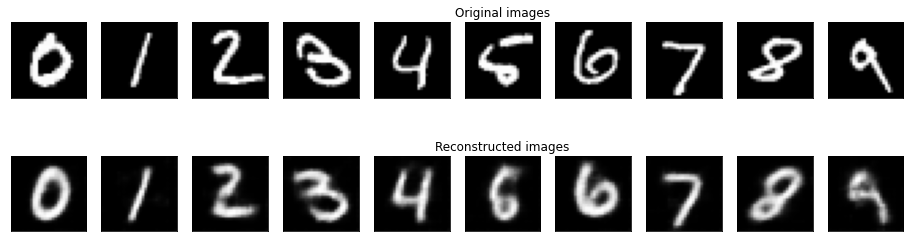

	 partial train loss (single batch): 8164.603027
	 partial train loss (single batch): 8056.270996
	 partial train loss (single batch): 8101.007324
	 partial train loss (single batch): 8156.465820
	 partial train loss (single batch): 8208.261719
	 partial train loss (single batch): 8424.220703
	 partial train loss (single batch): 8082.955078
	 partial train loss (single batch): 7761.910156
	 partial train loss (single batch): 8045.363770
	 partial train loss (single batch): 7984.923340
	 partial train loss (single batch): 8437.814453
	 partial train loss (single batch): 8139.064453
	 partial train loss (single batch): 7857.486328
	 partial train loss (single batch): 8484.004883
	 partial train loss (single batch): 8428.587891
	 partial train loss (single batch): 8150.077148
	 partial train loss (single batch): 7568.000000
	 partial train loss (single batch): 8091.538086
	 partial train loss (single batch): 8132.329590
	 partial train loss (single batch): 7938.367676
	 partial train loss

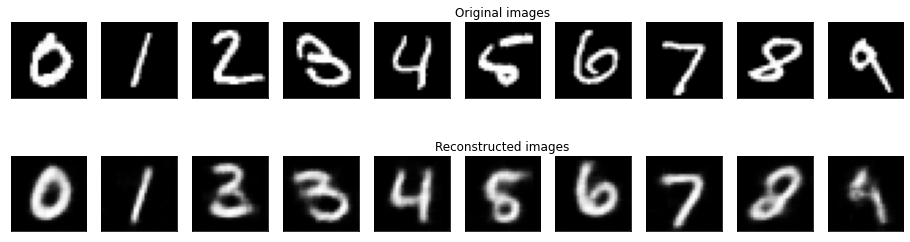

	 partial train loss (single batch): 8115.709473
	 partial train loss (single batch): 8121.560547
	 partial train loss (single batch): 8188.222656
	 partial train loss (single batch): 8239.974609
	 partial train loss (single batch): 8110.597656
	 partial train loss (single batch): 8388.246094
	 partial train loss (single batch): 8193.292969
	 partial train loss (single batch): 7878.239746
	 partial train loss (single batch): 8124.079102
	 partial train loss (single batch): 8005.479004
	 partial train loss (single batch): 8384.177734
	 partial train loss (single batch): 8203.112305
	 partial train loss (single batch): 7806.488281
	 partial train loss (single batch): 8425.472656
	 partial train loss (single batch): 8360.691406
	 partial train loss (single batch): 8089.938965
	 partial train loss (single batch): 7531.531250
	 partial train loss (single batch): 8105.397949
	 partial train loss (single batch): 8176.677246
	 partial train loss (single batch): 7916.977539
	 partial train loss

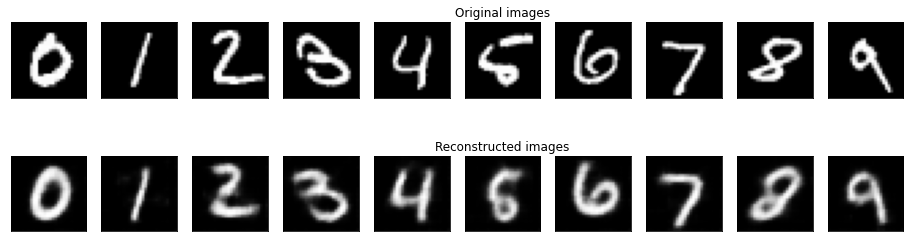

	 partial train loss (single batch): 8166.833496
	 partial train loss (single batch): 8123.478027
	 partial train loss (single batch): 8180.446289
	 partial train loss (single batch): 8250.617188
	 partial train loss (single batch): 8127.725586
	 partial train loss (single batch): 8391.416016
	 partial train loss (single batch): 8119.512695
	 partial train loss (single batch): 7817.417969
	 partial train loss (single batch): 8068.811035
	 partial train loss (single batch): 8072.347656
	 partial train loss (single batch): 8363.822266
	 partial train loss (single batch): 8147.602539
	 partial train loss (single batch): 7876.128906
	 partial train loss (single batch): 8448.366211
	 partial train loss (single batch): 8356.657227
	 partial train loss (single batch): 8090.721680
	 partial train loss (single batch): 7619.799805
	 partial train loss (single batch): 8033.083008
	 partial train loss (single batch): 8088.485840
	 partial train loss (single batch): 7889.859375
	 partial train loss

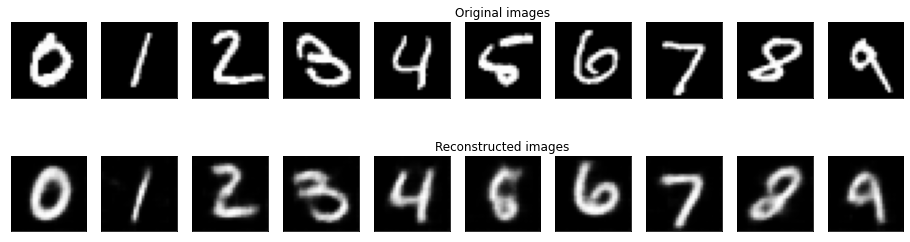

	 partial train loss (single batch): 8172.000000
	 partial train loss (single batch): 8146.218262
	 partial train loss (single batch): 8136.523438
	 partial train loss (single batch): 8230.830078
	 partial train loss (single batch): 8248.958984
	 partial train loss (single batch): 8401.383789
	 partial train loss (single batch): 8125.554199
	 partial train loss (single batch): 7846.687500
	 partial train loss (single batch): 8093.276367
	 partial train loss (single batch): 8065.604004
	 partial train loss (single batch): 8344.279297
	 partial train loss (single batch): 8132.938477
	 partial train loss (single batch): 7820.042480
	 partial train loss (single batch): 8472.663086
	 partial train loss (single batch): 8427.864258
	 partial train loss (single batch): 8182.520020
	 partial train loss (single batch): 7635.915527
	 partial train loss (single batch): 8109.664551
	 partial train loss (single batch): 8076.703125
	 partial train loss (single batch): 7903.232422
	 partial train loss

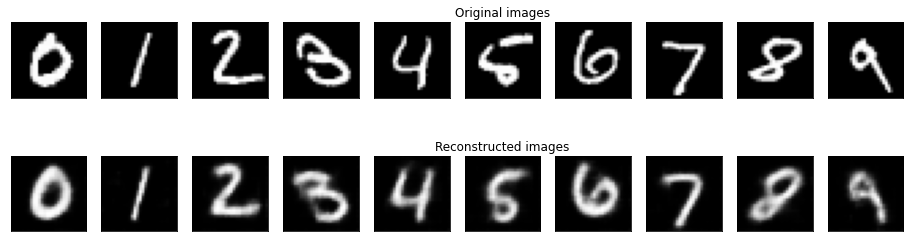

	 partial train loss (single batch): 8195.264648
	 partial train loss (single batch): 8053.455078
	 partial train loss (single batch): 8089.767578
	 partial train loss (single batch): 8229.687500
	 partial train loss (single batch): 8180.726562
	 partial train loss (single batch): 8318.207031
	 partial train loss (single batch): 8150.415039
	 partial train loss (single batch): 7790.785156
	 partial train loss (single batch): 8061.001465
	 partial train loss (single batch): 8038.896484
	 partial train loss (single batch): 8312.138672
	 partial train loss (single batch): 8074.419434
	 partial train loss (single batch): 7828.865234
	 partial train loss (single batch): 8464.178711
	 partial train loss (single batch): 8369.919922
	 partial train loss (single batch): 8116.286621
	 partial train loss (single batch): 7586.650879
	 partial train loss (single batch): 8099.044922
	 partial train loss (single batch): 8050.959961
	 partial train loss (single batch): 7923.474609
	 partial train loss

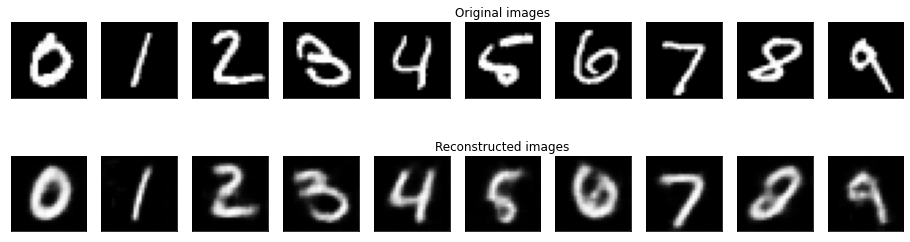

	 partial train loss (single batch): 8164.611328
	 partial train loss (single batch): 8063.086914
	 partial train loss (single batch): 8148.354004
	 partial train loss (single batch): 8209.271484
	 partial train loss (single batch): 8128.115723
	 partial train loss (single batch): 8375.493164
	 partial train loss (single batch): 8171.862305
	 partial train loss (single batch): 7815.620605
	 partial train loss (single batch): 8053.831543
	 partial train loss (single batch): 7979.139648
	 partial train loss (single batch): 8380.777344
	 partial train loss (single batch): 8067.656738
	 partial train loss (single batch): 7811.396973
	 partial train loss (single batch): 8430.560547
	 partial train loss (single batch): 8377.505859
	 partial train loss (single batch): 8081.324219
	 partial train loss (single batch): 7572.642090
	 partial train loss (single batch): 8074.292480
	 partial train loss (single batch): 8065.519043
	 partial train loss (single batch): 7910.121582
	 partial train loss

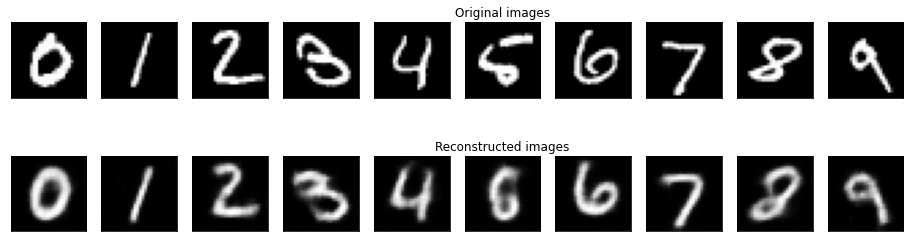

	 partial train loss (single batch): 8109.139648
	 partial train loss (single batch): 8189.168457
	 partial train loss (single batch): 8182.931641
	 partial train loss (single batch): 8199.572266
	 partial train loss (single batch): 8120.308594
	 partial train loss (single batch): 8358.384766
	 partial train loss (single batch): 8188.986328
	 partial train loss (single batch): 7824.463867
	 partial train loss (single batch): 8031.108398
	 partial train loss (single batch): 8022.693359
	 partial train loss (single batch): 8330.488281
	 partial train loss (single batch): 8090.796875
	 partial train loss (single batch): 7762.932617
	 partial train loss (single batch): 8537.342773
	 partial train loss (single batch): 8467.732422
	 partial train loss (single batch): 8205.222656
	 partial train loss (single batch): 7704.153320
	 partial train loss (single batch): 8041.038086
	 partial train loss (single batch): 8101.291016
	 partial train loss (single batch): 7922.613281
	 partial train loss

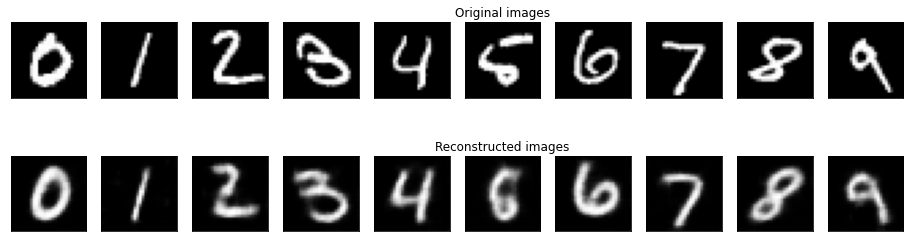

	 partial train loss (single batch): 8141.354492
	 partial train loss (single batch): 8113.712891
	 partial train loss (single batch): 8078.832031
	 partial train loss (single batch): 8148.284180
	 partial train loss (single batch): 8065.343262
	 partial train loss (single batch): 8320.462891
	 partial train loss (single batch): 8160.844238
	 partial train loss (single batch): 7728.150391
	 partial train loss (single batch): 8103.407715
	 partial train loss (single batch): 7994.010742
	 partial train loss (single batch): 8325.584961
	 partial train loss (single batch): 8079.253906
	 partial train loss (single batch): 7753.659668
	 partial train loss (single batch): 8416.803711
	 partial train loss (single batch): 8383.288086
	 partial train loss (single batch): 8121.127930
	 partial train loss (single batch): 7585.759277
	 partial train loss (single batch): 8109.294434
	 partial train loss (single batch): 8048.586914
	 partial train loss (single batch): 7863.487305
	 partial train loss

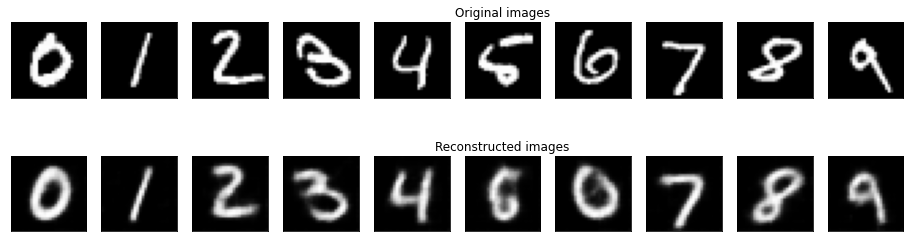

	 partial train loss (single batch): 8153.176758
	 partial train loss (single batch): 8092.611816
	 partial train loss (single batch): 8064.375000
	 partial train loss (single batch): 8303.134766
	 partial train loss (single batch): 8102.675781
	 partial train loss (single batch): 8321.738281
	 partial train loss (single batch): 8102.867188
	 partial train loss (single batch): 7760.576660
	 partial train loss (single batch): 8044.791016
	 partial train loss (single batch): 8013.184570
	 partial train loss (single batch): 8410.654297
	 partial train loss (single batch): 8083.124023
	 partial train loss (single batch): 7726.810547
	 partial train loss (single batch): 8460.803711
	 partial train loss (single batch): 8377.085938
	 partial train loss (single batch): 8142.839844
	 partial train loss (single batch): 7610.474609
	 partial train loss (single batch): 8088.422852
	 partial train loss (single batch): 8149.667480
	 partial train loss (single batch): 7927.941406
	 partial train loss

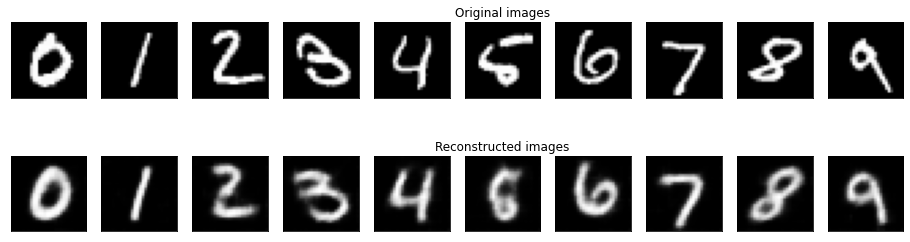

	 partial train loss (single batch): 8113.348633
	 partial train loss (single batch): 8038.802734
	 partial train loss (single batch): 8044.802734
	 partial train loss (single batch): 8285.993164
	 partial train loss (single batch): 8106.389648
	 partial train loss (single batch): 8312.531250
	 partial train loss (single batch): 8159.290039
	 partial train loss (single batch): 7728.103027
	 partial train loss (single batch): 8013.542969
	 partial train loss (single batch): 7998.473633
	 partial train loss (single batch): 8394.980469
	 partial train loss (single batch): 8181.525391
	 partial train loss (single batch): 7752.533691
	 partial train loss (single batch): 8442.216797
	 partial train loss (single batch): 8391.765625
	 partial train loss (single batch): 8178.458496
	 partial train loss (single batch): 7582.101562
	 partial train loss (single batch): 8058.528320
	 partial train loss (single batch): 8133.018555
	 partial train loss (single batch): 7881.026367
	 partial train loss

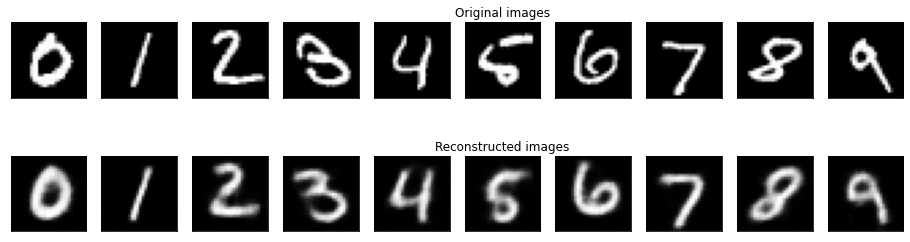

	 partial train loss (single batch): 8189.935547
	 partial train loss (single batch): 8099.319336
	 partial train loss (single batch): 8127.649902
	 partial train loss (single batch): 8158.648926
	 partial train loss (single batch): 8199.394531
	 partial train loss (single batch): 8361.519531
	 partial train loss (single batch): 8144.343262
	 partial train loss (single batch): 7753.306152
	 partial train loss (single batch): 8005.445312
	 partial train loss (single batch): 7945.120117
	 partial train loss (single batch): 8380.318359
	 partial train loss (single batch): 8156.740723
	 partial train loss (single batch): 7832.599121
	 partial train loss (single batch): 8386.775391
	 partial train loss (single batch): 8413.488281
	 partial train loss (single batch): 8156.385254
	 partial train loss (single batch): 7608.698730
	 partial train loss (single batch): 8065.030762
	 partial train loss (single batch): 8057.960938
	 partial train loss (single batch): 7851.239258
	 partial train loss

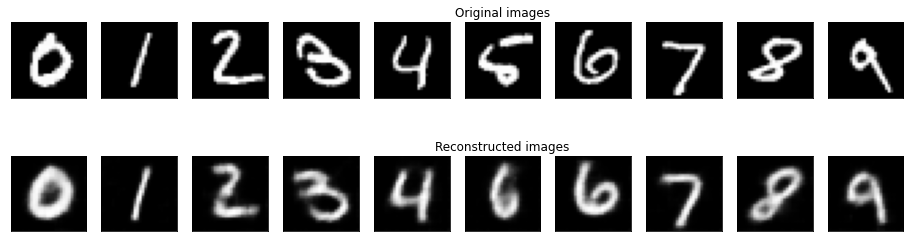

	 partial train loss (single batch): 8082.864746
	 partial train loss (single batch): 8056.395508
	 partial train loss (single batch): 8074.437500
	 partial train loss (single batch): 8205.385742
	 partial train loss (single batch): 8064.115723
	 partial train loss (single batch): 8374.154297
	 partial train loss (single batch): 8106.173828
	 partial train loss (single batch): 7747.491211
	 partial train loss (single batch): 8089.237305
	 partial train loss (single batch): 7986.294922
	 partial train loss (single batch): 8258.147461
	 partial train loss (single batch): 8156.678223
	 partial train loss (single batch): 7792.696289
	 partial train loss (single batch): 8394.989258
	 partial train loss (single batch): 8451.761719
	 partial train loss (single batch): 8140.424805
	 partial train loss (single batch): 7628.125488
	 partial train loss (single batch): 8045.428711
	 partial train loss (single batch): 8098.729004
	 partial train loss (single batch): 7868.474121
	 partial train loss

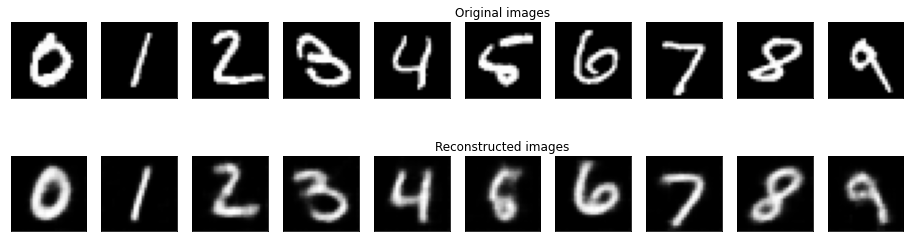

	 partial train loss (single batch): 8102.631836
	 partial train loss (single batch): 8068.025879
	 partial train loss (single batch): 8194.303711
	 partial train loss (single batch): 8157.059570
	 partial train loss (single batch): 8099.710938
	 partial train loss (single batch): 8274.539062
	 partial train loss (single batch): 8164.142090
	 partial train loss (single batch): 7832.469727
	 partial train loss (single batch): 8005.778809
	 partial train loss (single batch): 7962.010742
	 partial train loss (single batch): 8342.755859
	 partial train loss (single batch): 8096.207031
	 partial train loss (single batch): 7785.060059
	 partial train loss (single batch): 8388.330078
	 partial train loss (single batch): 8403.685547
	 partial train loss (single batch): 8112.680664
	 partial train loss (single batch): 7561.584473
	 partial train loss (single batch): 8090.576172
	 partial train loss (single batch): 8080.996094
	 partial train loss (single batch): 7834.060059
	 partial train loss

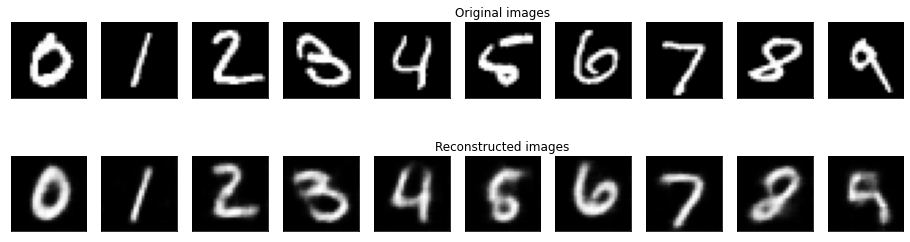

	 partial train loss (single batch): 8062.147461
	 partial train loss (single batch): 8032.961426
	 partial train loss (single batch): 8090.397461
	 partial train loss (single batch): 8141.423828
	 partial train loss (single batch): 8068.235352
	 partial train loss (single batch): 8301.636719
	 partial train loss (single batch): 8222.824219
	 partial train loss (single batch): 7796.208984
	 partial train loss (single batch): 8073.435547
	 partial train loss (single batch): 7991.467285
	 partial train loss (single batch): 8345.151367
	 partial train loss (single batch): 8079.209473
	 partial train loss (single batch): 7805.498535
	 partial train loss (single batch): 8442.300781
	 partial train loss (single batch): 8324.484375
	 partial train loss (single batch): 8144.330566
	 partial train loss (single batch): 7552.564941
	 partial train loss (single batch): 8115.715820
	 partial train loss (single batch): 8071.788574
	 partial train loss (single batch): 7875.616211
	 partial train loss

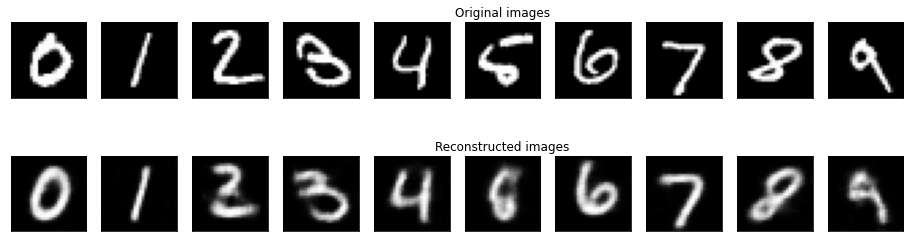

	 partial train loss (single batch): 8128.980469
	 partial train loss (single batch): 8079.813965
	 partial train loss (single batch): 8137.967285
	 partial train loss (single batch): 8220.778320
	 partial train loss (single batch): 8109.986328
	 partial train loss (single batch): 8393.517578
	 partial train loss (single batch): 8086.733887
	 partial train loss (single batch): 7775.648438
	 partial train loss (single batch): 8101.096680
	 partial train loss (single batch): 7956.470215
	 partial train loss (single batch): 8320.708008
	 partial train loss (single batch): 8094.456543
	 partial train loss (single batch): 7791.083984
	 partial train loss (single batch): 8445.615234
	 partial train loss (single batch): 8445.230469
	 partial train loss (single batch): 8155.057617
	 partial train loss (single batch): 7639.564453
	 partial train loss (single batch): 8032.036133
	 partial train loss (single batch): 8077.160156
	 partial train loss (single batch): 7755.876465
	 partial train loss

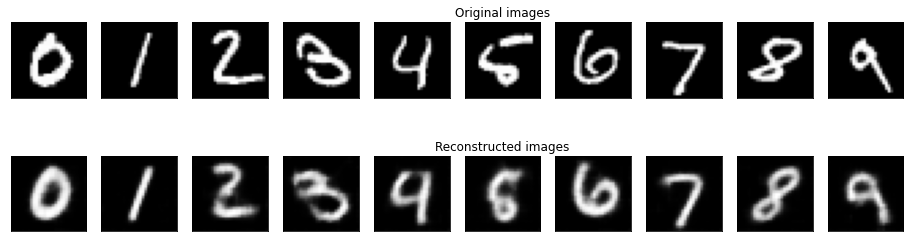

	 partial train loss (single batch): 8124.403320
	 partial train loss (single batch): 8156.314453
	 partial train loss (single batch): 8036.193848
	 partial train loss (single batch): 8184.730469
	 partial train loss (single batch): 8139.960938
	 partial train loss (single batch): 8316.671875
	 partial train loss (single batch): 8087.108398
	 partial train loss (single batch): 7723.252441
	 partial train loss (single batch): 8028.577637
	 partial train loss (single batch): 7992.399414
	 partial train loss (single batch): 8389.291992
	 partial train loss (single batch): 8066.865234
	 partial train loss (single batch): 7764.562012
	 partial train loss (single batch): 8425.557617
	 partial train loss (single batch): 8362.218750
	 partial train loss (single batch): 8062.436035
	 partial train loss (single batch): 7596.524414
	 partial train loss (single batch): 8145.452637
	 partial train loss (single batch): 8068.866211
	 partial train loss (single batch): 7806.995605
	 partial train loss

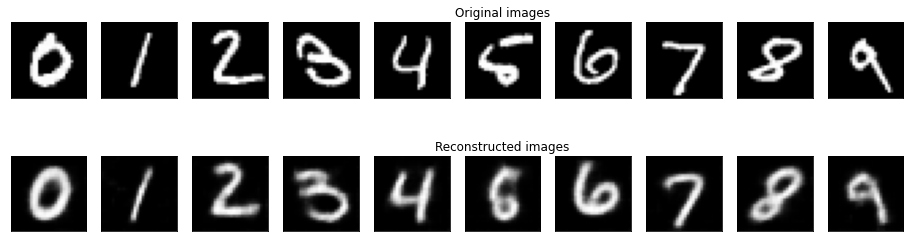

	 partial train loss (single batch): 8141.001953
	 partial train loss (single batch): 8121.026367
	 partial train loss (single batch): 8166.035645
	 partial train loss (single batch): 8209.484375
	 partial train loss (single batch): 8077.812500
	 partial train loss (single batch): 8349.524414
	 partial train loss (single batch): 8148.754883
	 partial train loss (single batch): 7717.867188
	 partial train loss (single batch): 8126.737793
	 partial train loss (single batch): 7945.536133
	 partial train loss (single batch): 8283.417969
	 partial train loss (single batch): 8002.022461
	 partial train loss (single batch): 7861.605469
	 partial train loss (single batch): 8381.407227
	 partial train loss (single batch): 8320.284180
	 partial train loss (single batch): 8148.960449
	 partial train loss (single batch): 7543.503906
	 partial train loss (single batch): 8096.493164
	 partial train loss (single batch): 8083.139160
	 partial train loss (single batch): 7889.420410
	 partial train loss

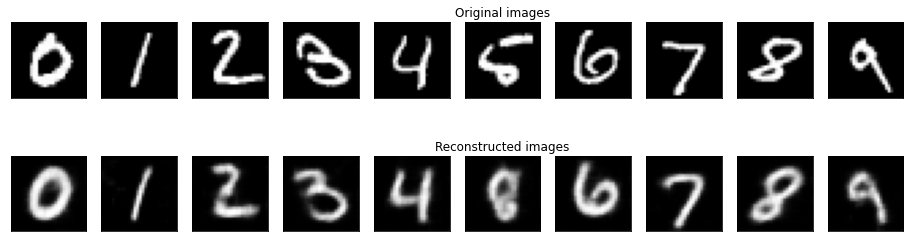

	 partial train loss (single batch): 8204.202148
	 partial train loss (single batch): 8051.680176
	 partial train loss (single batch): 8023.950684
	 partial train loss (single batch): 8123.130859
	 partial train loss (single batch): 8134.802734
	 partial train loss (single batch): 8269.437500
	 partial train loss (single batch): 8147.267578
	 partial train loss (single batch): 7787.687988
	 partial train loss (single batch): 8044.248047
	 partial train loss (single batch): 7934.130859
	 partial train loss (single batch): 8311.728516
	 partial train loss (single batch): 8101.169434
	 partial train loss (single batch): 7808.307617
	 partial train loss (single batch): 8364.112305
	 partial train loss (single batch): 8373.404297
	 partial train loss (single batch): 8080.603516
	 partial train loss (single batch): 7509.797852
	 partial train loss (single batch): 8048.006348
	 partial train loss (single batch): 8086.134766
	 partial train loss (single batch): 7854.390625
	 partial train loss

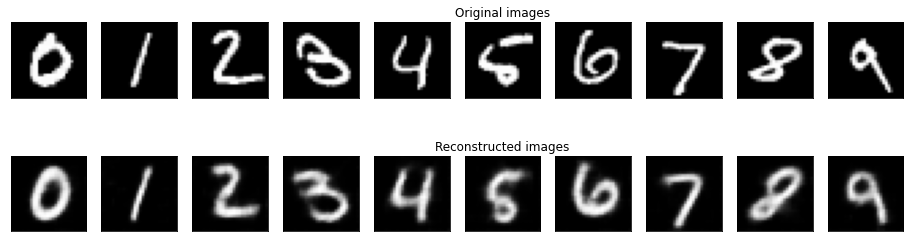

	 partial train loss (single batch): 8118.036133
	 partial train loss (single batch): 8109.955078
	 partial train loss (single batch): 8206.893555
	 partial train loss (single batch): 8222.036133
	 partial train loss (single batch): 8121.468262
	 partial train loss (single batch): 8347.577148
	 partial train loss (single batch): 8107.776367
	 partial train loss (single batch): 7756.676758
	 partial train loss (single batch): 8060.317383
	 partial train loss (single batch): 7956.004883
	 partial train loss (single batch): 8239.553711
	 partial train loss (single batch): 7975.143066
	 partial train loss (single batch): 7844.947266
	 partial train loss (single batch): 8386.107422
	 partial train loss (single batch): 8371.291016
	 partial train loss (single batch): 8118.540039
	 partial train loss (single batch): 7635.571289
	 partial train loss (single batch): 8070.805176
	 partial train loss (single batch): 8060.014160
	 partial train loss (single batch): 7786.986328
	 partial train loss

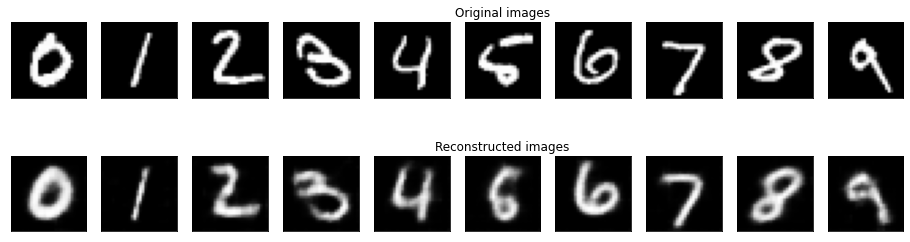

	 partial train loss (single batch): 8178.926270
	 partial train loss (single batch): 8056.538086
	 partial train loss (single batch): 8050.251465
	 partial train loss (single batch): 8123.467285
	 partial train loss (single batch): 8123.016113
	 partial train loss (single batch): 8304.783203
	 partial train loss (single batch): 8064.435059
	 partial train loss (single batch): 7742.166016
	 partial train loss (single batch): 8043.548828
	 partial train loss (single batch): 7920.867676
	 partial train loss (single batch): 8315.120117
	 partial train loss (single batch): 8071.846191
	 partial train loss (single batch): 7784.894531
	 partial train loss (single batch): 8380.321289
	 partial train loss (single batch): 8349.080078
	 partial train loss (single batch): 8155.371094
	 partial train loss (single batch): 7515.156250
	 partial train loss (single batch): 8030.009766
	 partial train loss (single batch): 8043.379883
	 partial train loss (single batch): 7820.484375
	 partial train loss

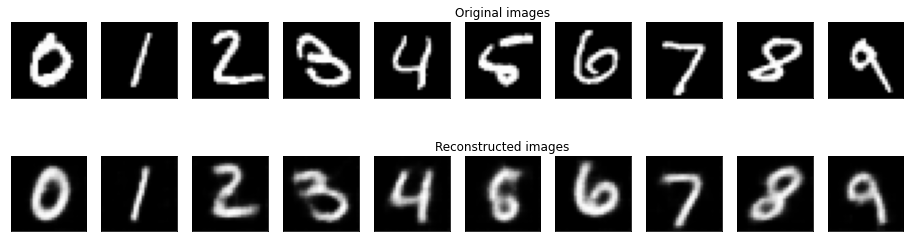

	 partial train loss (single batch): 8082.206055
	 partial train loss (single batch): 8131.396973
	 partial train loss (single batch): 8102.620605
	 partial train loss (single batch): 8240.378906
	 partial train loss (single batch): 8050.754883
	 partial train loss (single batch): 8252.086914
	 partial train loss (single batch): 8121.414062
	 partial train loss (single batch): 7753.977051
	 partial train loss (single batch): 7989.779297
	 partial train loss (single batch): 7942.331543
	 partial train loss (single batch): 8344.199219
	 partial train loss (single batch): 8127.311523
	 partial train loss (single batch): 7797.879883
	 partial train loss (single batch): 8375.627930
	 partial train loss (single batch): 8364.926758
	 partial train loss (single batch): 8176.828613
	 partial train loss (single batch): 7526.668457
	 partial train loss (single batch): 8056.465820
	 partial train loss (single batch): 8054.408691
	 partial train loss (single batch): 7847.587891
	 partial train loss

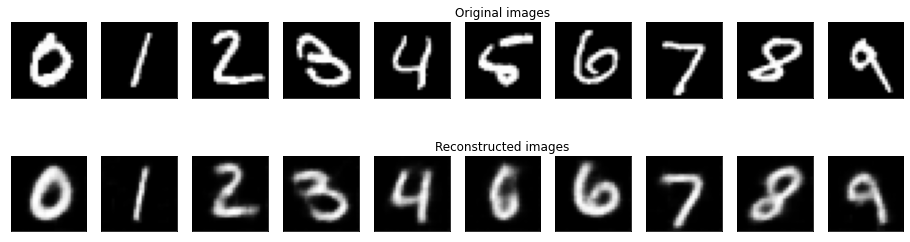

	 partial train loss (single batch): 8148.117676
	 partial train loss (single batch): 8099.624023
	 partial train loss (single batch): 8044.585938
	 partial train loss (single batch): 8162.143066
	 partial train loss (single batch): 8124.184570
	 partial train loss (single batch): 8324.479492
	 partial train loss (single batch): 8128.582031
	 partial train loss (single batch): 7716.439453
	 partial train loss (single batch): 7962.682617
	 partial train loss (single batch): 7938.598145
	 partial train loss (single batch): 8305.095703
	 partial train loss (single batch): 8070.275879
	 partial train loss (single batch): 7815.443359
	 partial train loss (single batch): 8421.050781
	 partial train loss (single batch): 8344.475586
	 partial train loss (single batch): 8090.691895
	 partial train loss (single batch): 7572.892578
	 partial train loss (single batch): 8017.420898
	 partial train loss (single batch): 8014.087891
	 partial train loss (single batch): 7890.375488
	 partial train loss

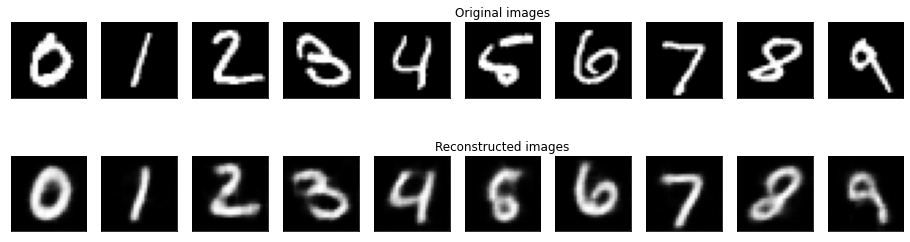

	 partial train loss (single batch): 8086.526855
	 partial train loss (single batch): 8110.507324
	 partial train loss (single batch): 8060.852539
	 partial train loss (single batch): 8168.348633
	 partial train loss (single batch): 8078.627930
	 partial train loss (single batch): 8296.955078
	 partial train loss (single batch): 8103.988281
	 partial train loss (single batch): 7754.347656
	 partial train loss (single batch): 7989.926758
	 partial train loss (single batch): 7975.800781
	 partial train loss (single batch): 8322.240234
	 partial train loss (single batch): 8107.991699
	 partial train loss (single batch): 7760.486816
	 partial train loss (single batch): 8449.001953
	 partial train loss (single batch): 8329.019531
	 partial train loss (single batch): 8073.612793
	 partial train loss (single batch): 7583.850098
	 partial train loss (single batch): 8034.465332
	 partial train loss (single batch): 8023.321289
	 partial train loss (single batch): 7832.587891
	 partial train loss

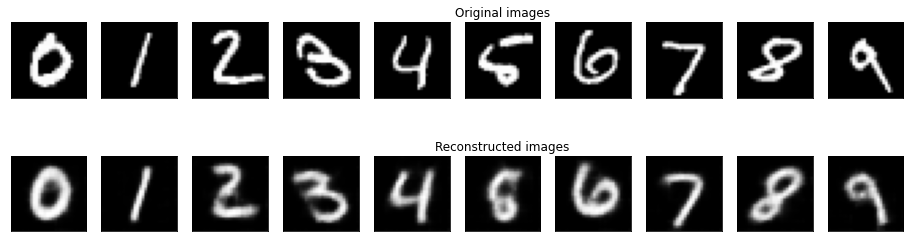

	 partial train loss (single batch): 8157.607422
	 partial train loss (single batch): 8074.094727
	 partial train loss (single batch): 8151.488281
	 partial train loss (single batch): 8194.606445
	 partial train loss (single batch): 8068.150391
	 partial train loss (single batch): 8257.773438
	 partial train loss (single batch): 8116.617188
	 partial train loss (single batch): 7709.486328
	 partial train loss (single batch): 8075.936523
	 partial train loss (single batch): 7978.127930
	 partial train loss (single batch): 8247.950195
	 partial train loss (single batch): 8118.841309
	 partial train loss (single batch): 7797.264160
	 partial train loss (single batch): 8364.283203
	 partial train loss (single batch): 8401.400391
	 partial train loss (single batch): 8042.153320
	 partial train loss (single batch): 7586.506836
	 partial train loss (single batch): 8088.620605
	 partial train loss (single batch): 8094.379883
	 partial train loss (single batch): 7832.318359
	 partial train loss

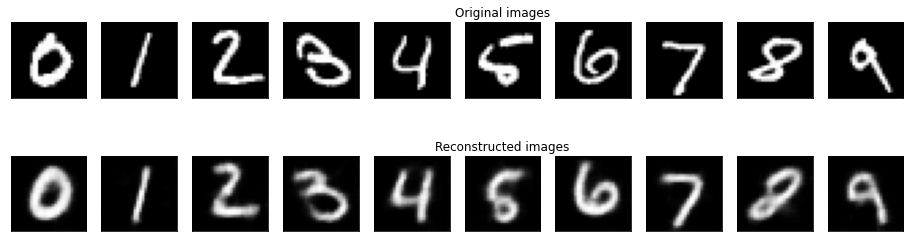

	 partial train loss (single batch): 8077.531250
	 partial train loss (single batch): 8053.750000
	 partial train loss (single batch): 8075.019043
	 partial train loss (single batch): 8197.193359
	 partial train loss (single batch): 8166.225098
	 partial train loss (single batch): 8263.927734
	 partial train loss (single batch): 8124.115723
	 partial train loss (single batch): 7744.019531
	 partial train loss (single batch): 8043.354492
	 partial train loss (single batch): 8081.706055
	 partial train loss (single batch): 8363.409180
	 partial train loss (single batch): 8025.970703
	 partial train loss (single batch): 7799.048828
	 partial train loss (single batch): 8336.265625
	 partial train loss (single batch): 8401.208984
	 partial train loss (single batch): 8064.677246
	 partial train loss (single batch): 7575.451172
	 partial train loss (single batch): 8038.977539
	 partial train loss (single batch): 8099.170898
	 partial train loss (single batch): 7827.487305
	 partial train loss

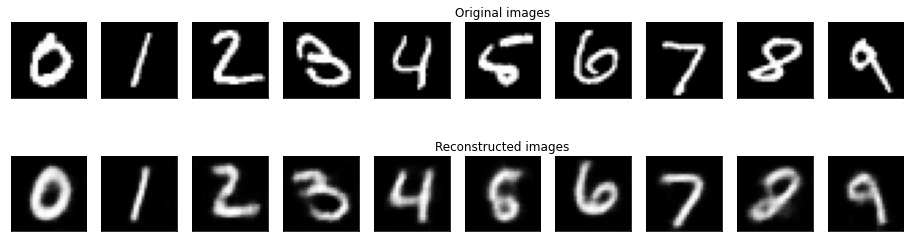

	 partial train loss (single batch): 8119.102539
	 partial train loss (single batch): 8077.885254
	 partial train loss (single batch): 8056.070801
	 partial train loss (single batch): 8124.190430
	 partial train loss (single batch): 8081.834961
	 partial train loss (single batch): 8283.927734
	 partial train loss (single batch): 8050.361328
	 partial train loss (single batch): 7672.275879
	 partial train loss (single batch): 7970.755859
	 partial train loss (single batch): 7965.830566
	 partial train loss (single batch): 8313.986328
	 partial train loss (single batch): 8044.242188
	 partial train loss (single batch): 7764.432617
	 partial train loss (single batch): 8435.945312
	 partial train loss (single batch): 8361.379883
	 partial train loss (single batch): 8093.045898
	 partial train loss (single batch): 7539.307129
	 partial train loss (single batch): 8046.058105
	 partial train loss (single batch): 8053.640625
	 partial train loss (single batch): 7830.419922
	 partial train loss

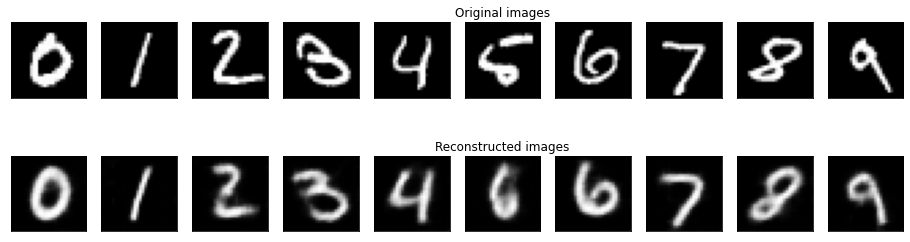

	 partial train loss (single batch): 8083.642090
	 partial train loss (single batch): 8081.508301
	 partial train loss (single batch): 8034.285156
	 partial train loss (single batch): 8186.585449
	 partial train loss (single batch): 8118.303711
	 partial train loss (single batch): 8331.542969
	 partial train loss (single batch): 8081.787109
	 partial train loss (single batch): 7724.719727
	 partial train loss (single batch): 7973.678711
	 partial train loss (single batch): 7906.488281
	 partial train loss (single batch): 8232.800781
	 partial train loss (single batch): 8076.166992
	 partial train loss (single batch): 7791.516113
	 partial train loss (single batch): 8359.787109
	 partial train loss (single batch): 8372.234375
	 partial train loss (single batch): 8106.808594
	 partial train loss (single batch): 7561.259766
	 partial train loss (single batch): 8021.906738
	 partial train loss (single batch): 8076.898438
	 partial train loss (single batch): 7809.456055
	 partial train loss

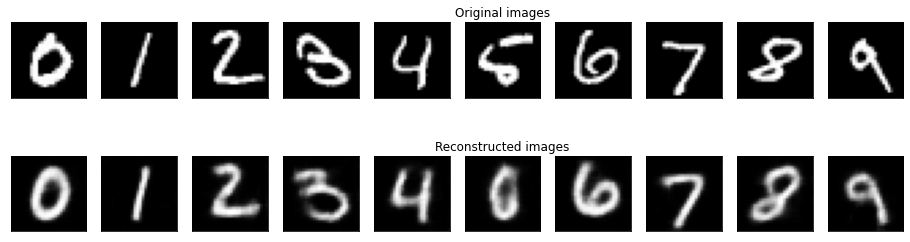

	 partial train loss (single batch): 8054.456543
	 partial train loss (single batch): 8003.671387
	 partial train loss (single batch): 8073.922852
	 partial train loss (single batch): 8221.578125
	 partial train loss (single batch): 8080.670410
	 partial train loss (single batch): 8250.639648
	 partial train loss (single batch): 8101.436523
	 partial train loss (single batch): 7694.730469
	 partial train loss (single batch): 8022.664062
	 partial train loss (single batch): 7933.613281
	 partial train loss (single batch): 8292.560547
	 partial train loss (single batch): 8024.903320
	 partial train loss (single batch): 7691.933594
	 partial train loss (single batch): 8360.116211
	 partial train loss (single batch): 8403.105469
	 partial train loss (single batch): 8005.970215
	 partial train loss (single batch): 7455.498535
	 partial train loss (single batch): 8014.302246
	 partial train loss (single batch): 7991.169922
	 partial train loss (single batch): 7818.577148
	 partial train loss

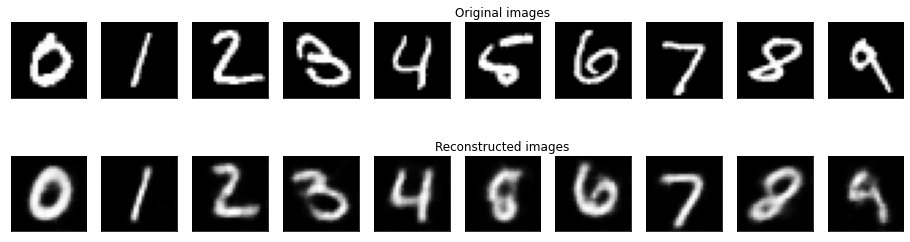

	 partial train loss (single batch): 8144.266602
	 partial train loss (single batch): 8047.882324
	 partial train loss (single batch): 8048.938477
	 partial train loss (single batch): 8185.868652
	 partial train loss (single batch): 8068.466797
	 partial train loss (single batch): 8290.664062
	 partial train loss (single batch): 8198.848633
	 partial train loss (single batch): 7664.749023
	 partial train loss (single batch): 7999.543945
	 partial train loss (single batch): 7977.687012
	 partial train loss (single batch): 8248.994141
	 partial train loss (single batch): 8101.207031
	 partial train loss (single batch): 7719.737305
	 partial train loss (single batch): 8347.280273
	 partial train loss (single batch): 8282.826172
	 partial train loss (single batch): 8084.444824
	 partial train loss (single batch): 7563.190430
	 partial train loss (single batch): 7975.448730
	 partial train loss (single batch): 8029.506836
	 partial train loss (single batch): 7783.456055
	 partial train loss

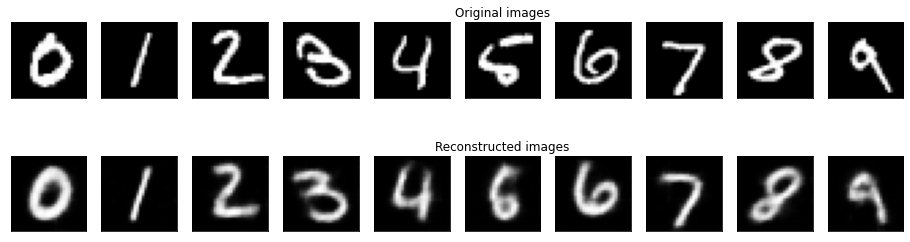

	 partial train loss (single batch): 8135.418945
	 partial train loss (single batch): 8091.691895
	 partial train loss (single batch): 8069.932617
	 partial train loss (single batch): 8144.581543
	 partial train loss (single batch): 8030.420410
	 partial train loss (single batch): 8259.432617
	 partial train loss (single batch): 8109.629883
	 partial train loss (single batch): 7728.078125
	 partial train loss (single batch): 7989.594727
	 partial train loss (single batch): 7878.328613
	 partial train loss (single batch): 8227.860352
	 partial train loss (single batch): 8102.789062
	 partial train loss (single batch): 7785.759277
	 partial train loss (single batch): 8383.509766
	 partial train loss (single batch): 8391.488281
	 partial train loss (single batch): 8076.350586
	 partial train loss (single batch): 7534.479980
	 partial train loss (single batch): 8021.637695
	 partial train loss (single batch): 8055.000488
	 partial train loss (single batch): 7880.583984
	 partial train loss

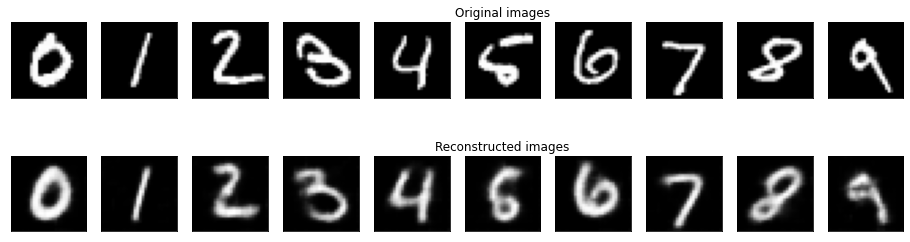

	 partial train loss (single batch): 8180.114258
	 partial train loss (single batch): 8116.066406
	 partial train loss (single batch): 8043.530762
	 partial train loss (single batch): 8185.612305
	 partial train loss (single batch): 8093.933105
	 partial train loss (single batch): 8290.892578
	 partial train loss (single batch): 8144.472656
	 partial train loss (single batch): 7767.588379
	 partial train loss (single batch): 8053.693848
	 partial train loss (single batch): 7987.174805
	 partial train loss (single batch): 8304.841797
	 partial train loss (single batch): 8079.391602
	 partial train loss (single batch): 7776.437012
	 partial train loss (single batch): 8369.226562
	 partial train loss (single batch): 8358.039062
	 partial train loss (single batch): 8131.151855
	 partial train loss (single batch): 7579.173340
	 partial train loss (single batch): 8084.792480
	 partial train loss (single batch): 8003.872070
	 partial train loss (single batch): 7774.174805
	 partial train loss

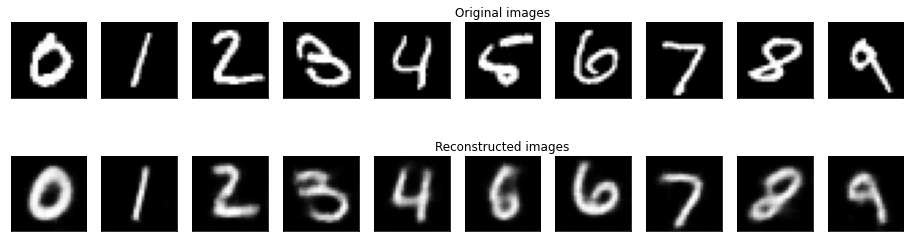

	 partial train loss (single batch): 8156.978516
	 partial train loss (single batch): 8065.638672
	 partial train loss (single batch): 8031.863281
	 partial train loss (single batch): 8171.067383
	 partial train loss (single batch): 8085.684082
	 partial train loss (single batch): 8234.874023
	 partial train loss (single batch): 8063.238770
	 partial train loss (single batch): 7669.334961
	 partial train loss (single batch): 7916.096680
	 partial train loss (single batch): 7993.430176
	 partial train loss (single batch): 8224.468750
	 partial train loss (single batch): 8035.459961
	 partial train loss (single batch): 7731.849609
	 partial train loss (single batch): 8362.873047
	 partial train loss (single batch): 8339.645508
	 partial train loss (single batch): 8036.341309
	 partial train loss (single batch): 7556.054688
	 partial train loss (single batch): 7981.725586
	 partial train loss (single batch): 8052.665527
	 partial train loss (single batch): 7809.857910
	 partial train loss

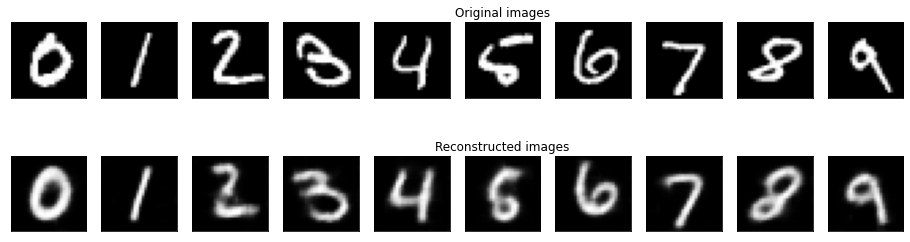

	 partial train loss (single batch): 8083.819336
	 partial train loss (single batch): 8016.019043
	 partial train loss (single batch): 8087.221680
	 partial train loss (single batch): 8112.951660
	 partial train loss (single batch): 8079.921875
	 partial train loss (single batch): 8253.318359
	 partial train loss (single batch): 8178.467773
	 partial train loss (single batch): 7755.945801
	 partial train loss (single batch): 7970.625977
	 partial train loss (single batch): 7989.682617
	 partial train loss (single batch): 8272.546875
	 partial train loss (single batch): 8049.184082
	 partial train loss (single batch): 7761.500000
	 partial train loss (single batch): 8401.445312
	 partial train loss (single batch): 8365.882812
	 partial train loss (single batch): 8077.984863
	 partial train loss (single batch): 7492.218750
	 partial train loss (single batch): 8081.260742
	 partial train loss (single batch): 7991.643555
	 partial train loss (single batch): 7804.267578
	 partial train loss

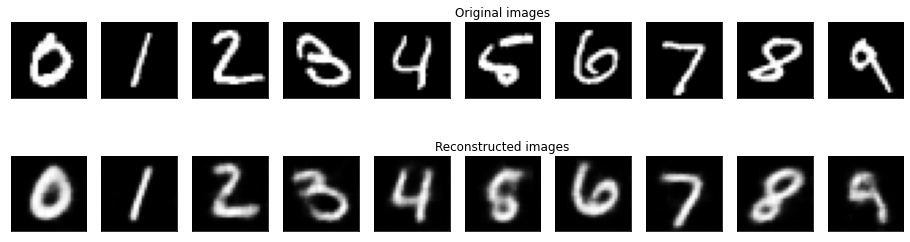

	 partial train loss (single batch): 8071.748047
	 partial train loss (single batch): 8074.200195
	 partial train loss (single batch): 8071.869629
	 partial train loss (single batch): 8150.059570
	 partial train loss (single batch): 7999.288574
	 partial train loss (single batch): 8248.145508
	 partial train loss (single batch): 8158.666992
	 partial train loss (single batch): 7730.378906
	 partial train loss (single batch): 7976.343750
	 partial train loss (single batch): 8001.960938
	 partial train loss (single batch): 8264.549805
	 partial train loss (single batch): 8039.053223
	 partial train loss (single batch): 7746.936035
	 partial train loss (single batch): 8366.277344
	 partial train loss (single batch): 8338.411133
	 partial train loss (single batch): 8022.441895
	 partial train loss (single batch): 7541.833984
	 partial train loss (single batch): 8089.235352
	 partial train loss (single batch): 7983.580566
	 partial train loss (single batch): 7827.598633
	 partial train loss

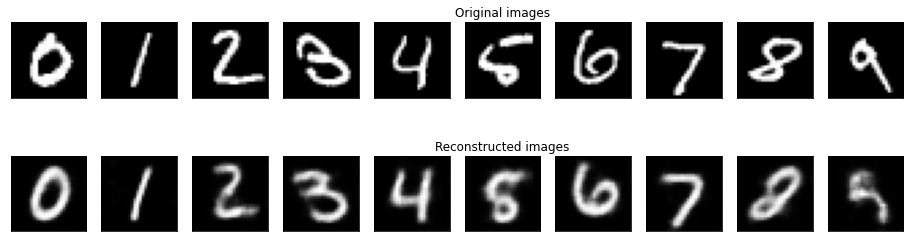

In [101]:
num_epochs = 100

for epoch in range(num_epochs):
   train_loss = train_epoch(vae, device, train_loader,optim)
   val_loss = test_epoch(vae, device, valid_loader)
   print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   plot_ae_outputs(vae.encoder,vae.decoder,n=10)

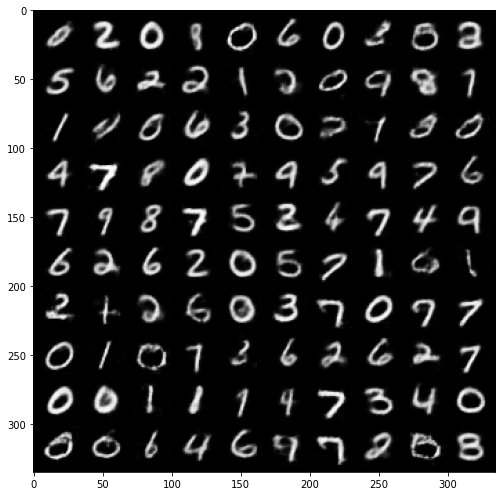

In [102]:

def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


vae.eval()

with torch.no_grad():

    # sample latent vectors from the normal distribution
    latent = torch.randn(128, d, device=device)

    # reconstruct images from the latent vectors
    img_recon = vae.decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon.data[:100],10,5))
    plt.show()

In [103]:

from tqdm import tqdm
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    vae.eval()
    with torch.no_grad():
        encoded_img  = vae.encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
    
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples = encoded_samples.sort_values(by=['label'])
encoded_samples

100%|██████████| 10000/10000 [00:12<00:00, 795.58it/s]


,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,label
4999,-1.913757,-0.013998,-0.088669,-0.370188,0
7747,-1.041471,0.049798,-0.103161,-1.709959,0
1297,-1.088092,0.400824,-0.149175,-0.082272,0
9311,-1.340754,1.151990,0.689751,-0.307377,0
1294,-1.019304,0.240862,0.158420,-0.045853,0
...,...,...,...,...,...
6870,-0.195996,-0.969782,0.419421,0.300649,9
3168,-0.175967,-0.937093,-0.257342,-0.091228,9
4673,0.046400,-0.577847,0.511600,-0.778012,9
6888,0.378955,-0.676494,-0.552305,0.192601,9


In [104]:
from sklearn.manifold import TSNE
import plotly.express as px

px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples.label.astype(str), opacity=0.7)

In [105]:
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(encoded_samples.drop(['label'],axis=1))

fig = px.scatter(tsne_results, x=0, y=1, color=encoded_samples.label.astype(str),labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



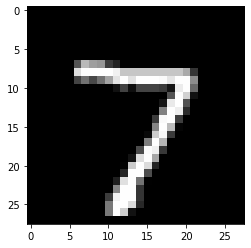

In [106]:
i = 0
j = 0
plt.imshow(test_dataset[i+ j*10][0].squeeze().numpy())

In [107]:
z = vae.encoder(test_dataset[i+ j*10][0].unsqueeze(0).to(device))
reconstructed = vae.decoder(z)

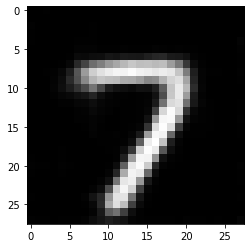

In [108]:
plt.imshow(reconstructed.cpu().squeeze().detach().numpy())

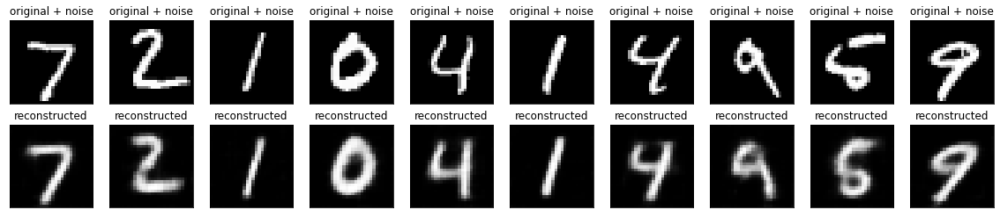

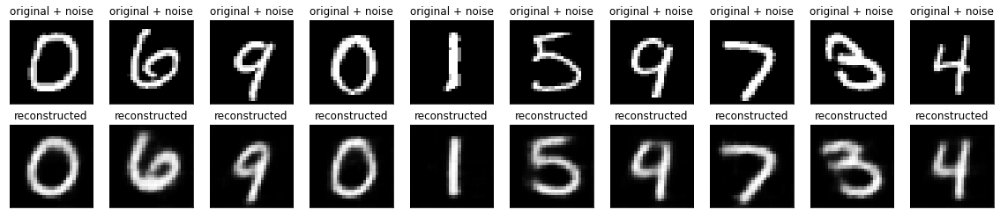

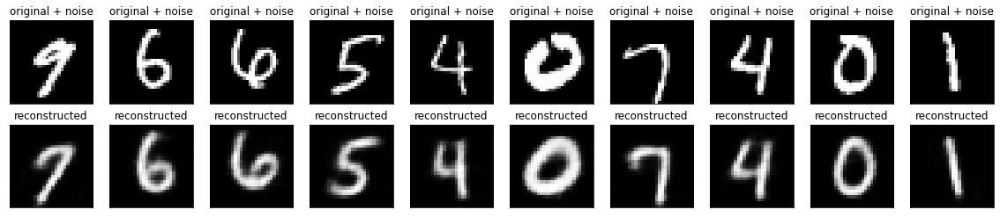

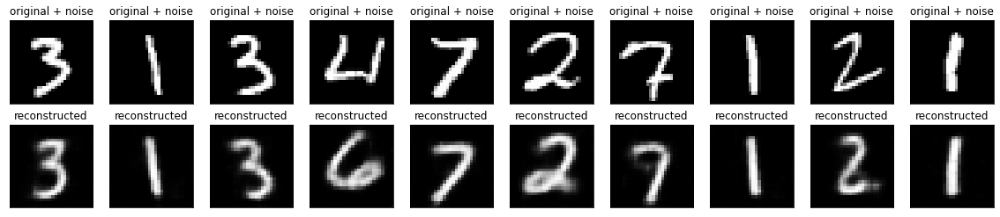

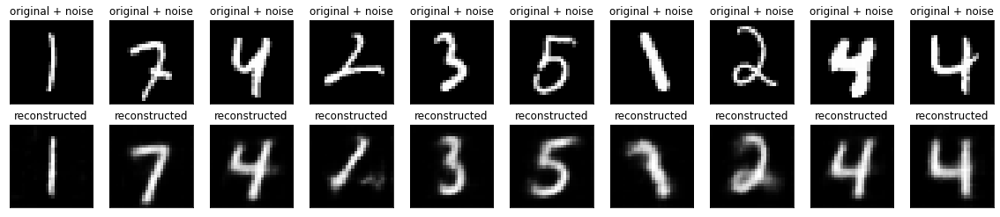

In [109]:
n = 10

for j in range(5):
  plt.figure(figsize=(20, 4))
  for i in range(n):
    # display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(test_dataset[i+ j*10][0].squeeze().numpy())
    plt.title("original + noise")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)


    z = vae.encoder(test_dataset[i+ j*10][0].unsqueeze(0).to(device))
    reconstructed = vae.decoder(z)
    # display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(reconstructed.cpu().squeeze().detach().numpy())
    plt.title("reconstructed")
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
  plt.show()